<a href="https://colab.research.google.com/github/RAVIPATISRIVIDYA/devtraining-needit-madrid/blob/master/Evasion_attacksfinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install adversarial-robustness-toolbox

     |████████████████████████████████| 1.1 MB 2.3 MB/s 
     |████████████████████████████████| 3.3 MB 36.0 MB/s 
     |████████████████████████████████| 26.3 MB 83 kB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2


In [2]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
from tensorflow import keras
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import art

In [3]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

In [4]:
def show_image(image, label=None):
  
  class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

  plt.figure(figsize=(15,15))
  plt.subplot(5,5,1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image, cmap=plt.cm.binary)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
  if label != None:
   plt.xlabel(class_names[label[0]])
  plt.show()


def get_label(model_prediction):
  """given the prediction of a model this function 
  prints out the associated label"""

  return class_names[np.argmax(model_prediction)]

def get_confidence(classifier, example):

  """Gets confidence levels for predictions"""
  
  pred = classifier.predict(example)
  label = np.argmax(pred,axis=1)
  confidence = np.max(pred, axis=1)

  print('label:',class_names[label[0]],'confidence:',confidence[0])

def get_attack_name(attack):
  """Returns attack name"""
  return str(attack).split('.')[3]

def get_attack_type(attack):
  """Returns attack type"""
  return str(attack).split('.')[2]
  
def get_defense_name(defense):
  """Returns defense name"""
  return str(defense).split('.')[3]

def get_defense_type(defense):
  """Returns defense type"""
  return str(defense).split('.')[2]

In [5]:
#loading data
(x_train,y_train),(x_test,y_test) = keras.datasets.cifar10.load_data()

170508288/170498071 [==============================] - 3s 0us/step


In [6]:
#normalizing data
x_train = x_train/255
x_test = x_test/255

In [7]:
#getting even number of classes and storing them in x_subsample and y_subsample
x_subsample = np.reshape(np.array([]),(0,32,32,3))
y_subsample = np.reshape(np.array([],dtype='int'),(0,1))

for i in range(len(np.unique(y_test))):
  
  index = (y_test==i).reshape(10000)
  x_subsample = np.append(x_subsample,x_test[index][40:50],axis=0)
  y_subsample = np.append(y_subsample, y_test[index][40:50],axis=0)

In [8]:
#showing that there are 10 examples from each class
from collections import Counter

Counter(np.reshape(y_subsample,(100)))

Counter({0: 10, 1: 10, 2: 10, 3: 10, 4: 10, 5: 10, 6: 10, 7: 10, 8: 10, 9: 10})

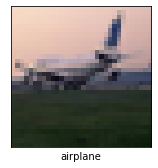

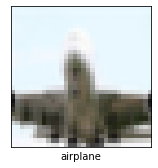

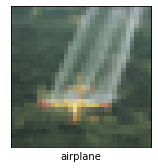

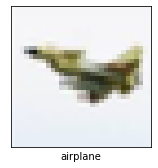

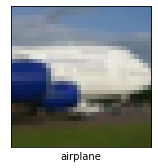

...

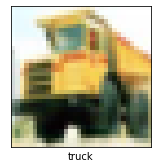

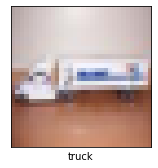

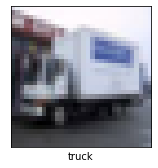

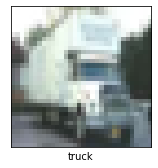

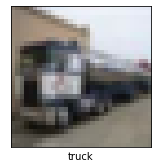

In [9]:
#checking that the training examples match the labels chosen
for i in range(len(y_subsample)):
  show_image(x_subsample[i],y_subsample[i])

In [10]:
print('feature_shape',x_subsample[0].shape)
print('label_shape',y_train[0].shape)

feature_shape (32, 32, 3)
label_shape (1,)


In [12]:
#loading victim model
victim_model = keras.Sequential([keras.layers.Input(shape=(32,32,3)),
                                 hub.KerasLayer("https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1",
                                 input_shape=(32,32,3),output_shape=(10),name='Victim_Model'),
                                 keras.layers.Softmax()
                                 ])

In [13]:
#building victim model to expect input shape of (batch size, image_height, image_width, image_depth/num_channels)
victim_model.build(input_shape=(100,32,32,3))

In [14]:
metrics = ['mae','accuracy',]#IGNORE

In [15]:
victim_model.compile(keras.optimizers.SGD(momentum=0.9,learning_rate=0.1),
                     loss=keras.losses.binary_crossentropy,
                     metrics = metrics)

In [16]:
#model summary
victim_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Victim_Model (KerasLayer)   (None, 10)                7796426   
                                                                 
 softmax (Softmax)           (None, 10)                0         
                                                                 
Total params: 7,796,426
Trainable params: 0
Non-trainable params: 7,796,426
_________________________________________________________________


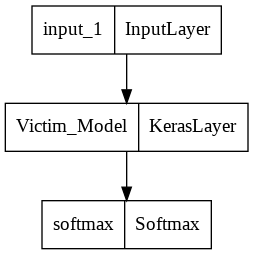

In [17]:
from tensorflow.keras.utils import plot_model

plot_model(victim_model )

Classifier


In [18]:
import art
classifier = art.estimators.classification.KerasClassifier(model = victim_model,clip_values=(0.,1.),use_logits=True)

Attack Function


In [19]:
def perform_attack(attack, defenses = [], x=x_subsample, y=y_subsample, targeted=False):
  """Performs attack and show results.
  If defenses are provided it performs each defense and
  shows results."""

  #attack classifier
  #classifier = attack.classifier

  if targeted:
    y = targeted_labels

  #this routine is specific for adversarial patch examples
  if get_attack_name(attack)=='adversarial_patch':

    attack.generate(x)
    x_adversarial = adversarial_patch.apply_patch(x.copy(),0.3)
  
  
  else:
    x_adversarial = attack.generate(x,y)
    
  #metrics to measure 
  from sklearn.metrics import classification_report, accuracy_score
  from art.metrics import empirical_robustness

  
  #predictions without defense 
  attack_classifier_pred_originals =  np.argmax(classifier.predict(x),axis=1)
  attack_classifier_pred_adversarial =  np.argmax(classifier.predict(x_adversarial),axis=1)

  print('\nAttack effects on image\n==========================================================')

  #Showing visual impact
  for i in np.random.random_integers(0,99,3):
    print('\nBefore')
    show_image(x[i])
    get_confidence(classifier, np.expand_dims(x[i],0))

    print('\nAfter')
    show_image(x_adversarial[i])
    get_confidence(classifier, np.expand_dims(x_adversarial[i],0))

  print('\nPerformance w/ No Defense\n==========================================================================')
  print('performance on originals examples:\n','Accuracy:',accuracy_score(y_subsample, attack_classifier_pred_originals),'\n',classification_report(y_subsample, attack_classifier_pred_originals))

  print('performance on adversarial examples:\n','Accuracy:',accuracy_score(y_subsample, attack_classifier_pred_adversarial),'\n',classification_report(y_subsample, attack_classifier_pred_adversarial))

  print('\n======================================================================================')

  for defense in defenses:
    
    print('\nWith ',get_defense_name(defense),'defense applied\n===============================================================\n')

    #showing confidence before
    print('BEFORE DEFENSE')
    selected_images_idx = np.random.random_integers(0,99,1)

    for i in selected_images_idx:
      show_image(x[i])
      get_confidence(classifier, np.expand_dims(x[i],0))

    #mounting defense to classifier
    if get_defense_type(defense) == 'preprocessor':
      classifier.preprocessing_defences = [defense]
    elif get_defense_type(defense) == 'postprocessor':
      classifier.postprocessing_defences = [defense]

    #prediction with defenses 
    defense_classifier_pred_originals =  np.argmax(classifier.predict(x),axis=1)
    defense_classifier_pred_adversarial =  np.argmax(classifier.predict(x_adversarial),axis=1)

    #with defense applied
    print('\nPerformance on originals examples:\n','Accuracy:',accuracy_score(y_subsample,defense_classifier_pred_originals ),'\n',classification_report(y_subsample, defense_classifier_pred_originals))

    print('Performance on adversarial examples:\n','Accuracy:',accuracy_score(y_subsample, defense_classifier_pred_adversarial),'\n',classification_report(y_subsample, defense_classifier_pred_adversarial))

    print('\nWITH DEFENSE')
    #showing confidence after
    for i in selected_images_idx:
      show_image(x_adversarial[i])
      get_confidence(classifier, np.expand_dims(x_adversarial[i],0))

    #reset defence parameter to None
    classifier.preprocessing_defences = None
    classifier.postprocessing_defences = None

In [20]:
targeted_labels = np.roll(y_subsample,20)

In [21]:
import art.defences
from art.defences.preprocessor import GaussianAugmentation
from art.defences.postprocessor import ClassLabels
from art.defences.postprocessor import HighConfidence,ReverseSigmoid,Rounded
from art.defences.preprocessor import LabelSmoothing
from art.defences.preprocessor import FeatureSqueezing
from art.defences.preprocessor import SpatialSmoothing,PixelDefend,ThermometerEncoding,TotalVarMin
from art.defences.trainer import AdversarialTrainer,AdversarialTrainerMadryPGD,AdversarialTrainerFBF
from typing import List
from art.defences.transformer.evasion import DefensiveDistillation
from art.defences.detector.evasion import BinaryInputDetector,BinaryActivationDetector
from art.defences.detector.evasion.subsetscanning import SubsetScanningDetector

defenses = [GaussianAugmentation(augmentation=False, sigma=.02, apply_predict=True), 
            LabelSmoothing(max_value=.9),ClassLabels(),HighConfidence(cutoff=1.),FeatureSqueezing(clip_values=(0,1)),SpatialSmoothing(),ThermometerEncoding(clip_values=(0,1)),TotalVarMin(),ReverseSigmoid(),Rounded(decimals=2,apply_predict=True),
            AdversarialTrainerMadryPGD(classifier=classifier),DefensiveDistillation(classifier=classifier,nb_epochs=2),
            BinaryInputDetector(detector=classifier),BinaryActivationDetector(classifier=classifier,detector=classifier,layer=0)]

Elastic Net Attack


EAD:   0%|          | 0/4 [00:00<?, ?it/s]


Attack effects on image

Before


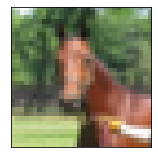

label: horse confidence: 0.99998045

After


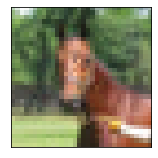

label: cat confidence: 0.94295377

Before


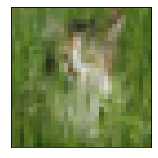

label: deer confidence: 0.7332446

After


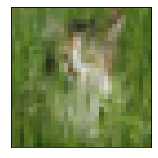

label: deer confidence: 0.7332446

Before


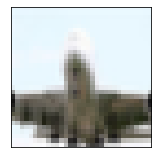

label: airplane confidence: 0.997783

After


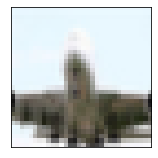

label: truck confidence: 0.7149761

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0    

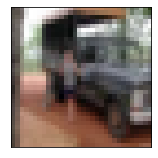

label: truck confidence: 0.6251874

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

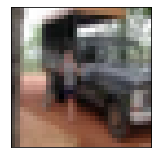

label: automobile confidence: 0.5335099

With  label_smoothing defense applied

BEFORE DEFENSE


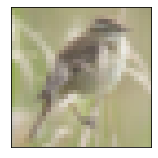

label: bird confidence: 0.9998896

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

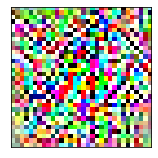

label: truck confidence: 0.82684565

With  class_labels defense applied

BEFORE DEFENSE


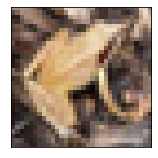

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

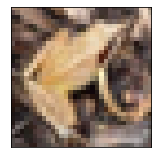

label: dog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


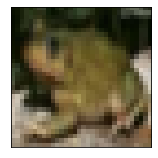

label: frog confidence: 0.99988115

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

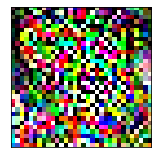

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


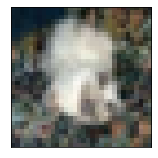

label: frog confidence: 0.5888467

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

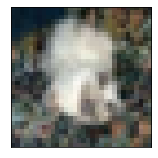

label: frog confidence: 0.5888467

With  spatial_smoothing defense applied

BEFORE DEFENSE


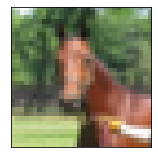

label: horse confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

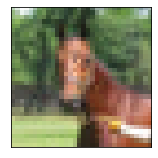

label: cat confidence: 0.94295377

With  thermometer_encoding defense applied

BEFORE DEFENSE


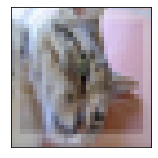

label: cat confidence: 0.863001

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

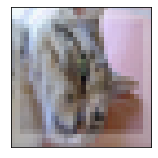

label: deer confidence: 0.36548385

With  variance_minimization defense applied

BEFORE DEFENSE


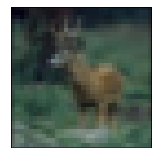

label: deer confidence: 0.9999782

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

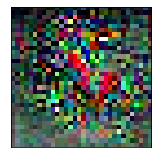

label: cat confidence: 0.7979816

With  reverse_sigmoid defense applied

BEFORE DEFENSE


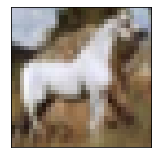

label: horse confidence: 0.99897206

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

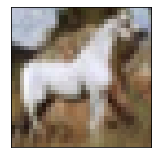

label: frog confidence: 0.26321924

With  rounded defense applied

BEFORE DEFENSE


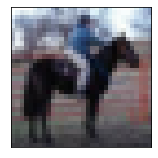

label: horse confidence: 0.9999865

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.05 
               precision    recall  f1-score   support

           0       0.07      0.10      0.0

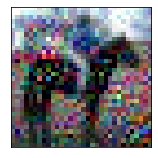

label: cat confidence: 0.62

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


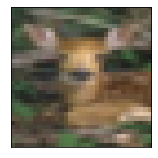

label: deer confidence: 0.99775934

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

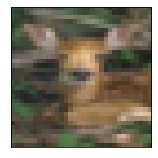

label: dog confidence: 0.7031107

With  evasion defense applied

BEFORE DEFENSE


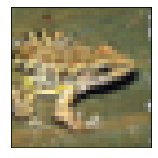

label: frog confidence: 0.9994697

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

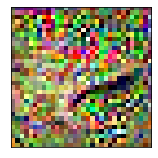

label: airplane confidence: 0.37313426

With  0, std=1 defense applied

BEFORE DEFENSE


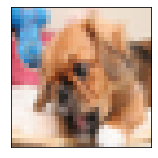

label: dog confidence: 0.99961483

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

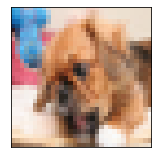

label: cat confidence: 0.6173024

With  0, std=1 defense applied

BEFORE DEFENSE


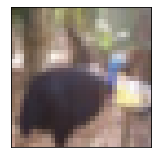

label: bird confidence: 0.9999994

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.04 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

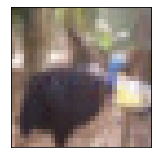

label: deer confidence: 0.87191457

                                                 TARGETED ATTACK                                                



EAD:   0%|          | 0/4 [00:00<?, ?it/s]


Attack effects on image

Before


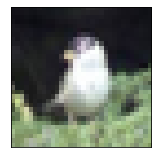

label: bird confidence: 0.99892396

After


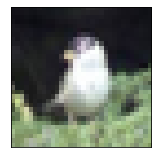

label: bird confidence: 0.99892396

Before


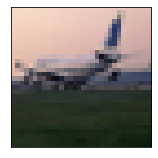

label: airplane confidence: 0.9999547

After


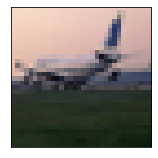

label: airplane confidence: 0.9999547

Before


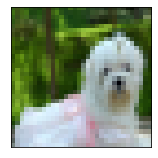

label: dog confidence: 0.99533075

After


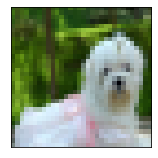

label: dog confidence: 0.99533075

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0      

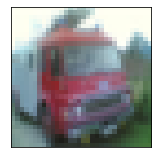

label: truck confidence: 0.9999789

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

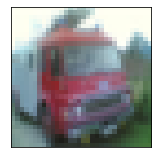

label: truck confidence: 0.9999789

With  label_smoothing defense applied

BEFORE DEFENSE


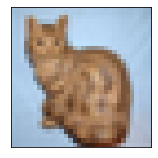

label: cat confidence: 0.99942636

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

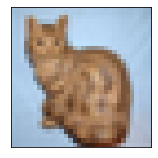

label: cat confidence: 0.99942636

With  class_labels defense applied

BEFORE DEFENSE


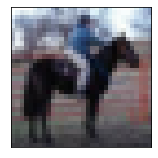

label: horse confidence: 0.9999865

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

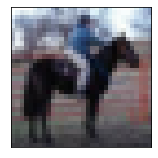

label: horse confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


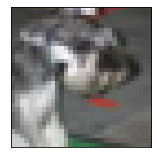

label: cat confidence: 0.9982356

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

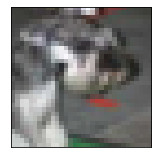

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


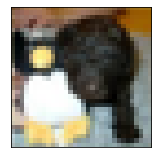

label: dog confidence: 0.8305685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

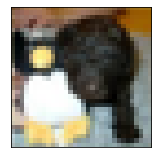

label: dog confidence: 0.8305685

With  spatial_smoothing defense applied

BEFORE DEFENSE


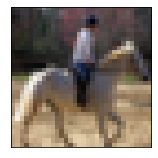

label: horse confidence: 0.9999925

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

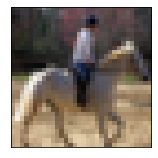

label: horse confidence: 0.9999925

With  thermometer_encoding defense applied

BEFORE DEFENSE


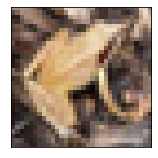

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

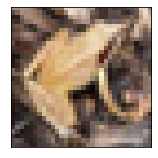

label: frog confidence: 0.955936

With  variance_minimization defense applied

BEFORE DEFENSE


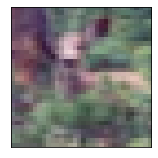

label: deer confidence: 0.9994727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

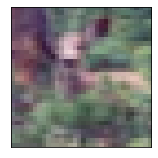

label: deer confidence: 0.9994727

With  reverse_sigmoid defense applied

BEFORE DEFENSE


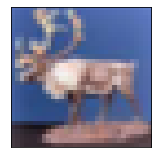

label: deer confidence: 0.9916221

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

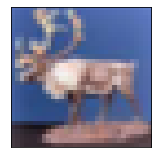

label: deer confidence: 0.35571262

With  rounded defense applied

BEFORE DEFENSE


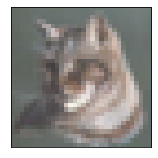

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

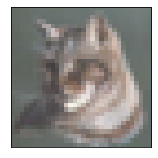

label: cat confidence: 0.98

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


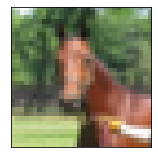

label: horse confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

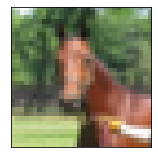

label: horse confidence: 0.99998045

With  evasion defense applied

BEFORE DEFENSE


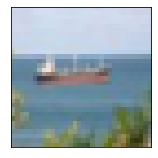

label: ship confidence: 0.99995315

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

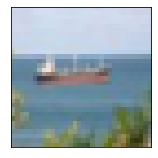

label: ship confidence: 0.99995315

With  0, std=1 defense applied

BEFORE DEFENSE


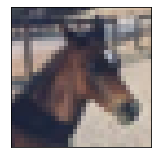

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

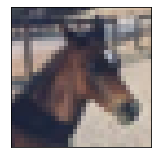

label: horse confidence: 0.999793

With  0, std=1 defense applied

BEFORE DEFENSE


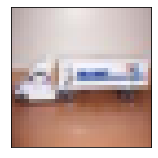

label: truck confidence: 0.9999751

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

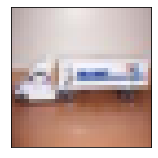

label: truck confidence: 0.9999751


In [22]:
from art.attacks.evasion import ElasticNet
elastic_net = ElasticNet(classifier=classifier,batch_size=32,max_iter=1,learning_rate=0.1,)
elastic_net_targeted = ElasticNet(classifier=classifier,batch_size=32,max_iter=5,learning_rate=0.1,targeted=True)
perform_attack(elastic_net, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')
perform_attack(elastic_net_targeted, defenses)

EAD:   0%|          | 0/4 [00:00<?, ?it/s]


Attack effects on image

Before


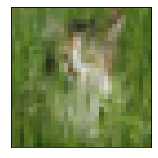

label: deer confidence: 0.7332446

After


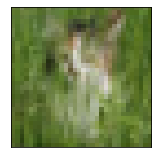

label: cat confidence: 0.5041393

Before


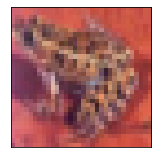

label: frog confidence: 0.99787664

After


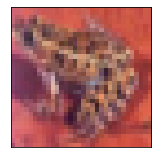

label: frog confidence: 0.99787664

Before


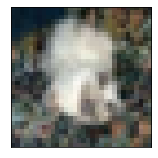

label: frog confidence: 0.5888467

After


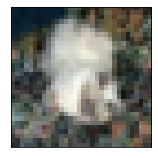

label: cat confidence: 0.33590233

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0      

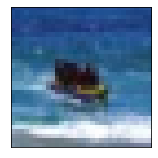

label: ship confidence: 0.42085823

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

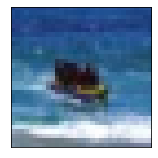

label: ship confidence: 0.42085823

With  label_smoothing defense applied

BEFORE DEFENSE


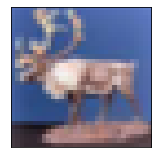

label: deer confidence: 0.9916221

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

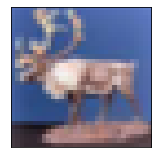

label: deer confidence: 0.9916221

With  class_labels defense applied

BEFORE DEFENSE


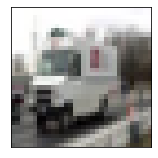

label: truck confidence: 0.99987054

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18

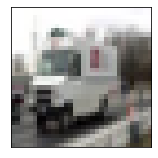

label: truck confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


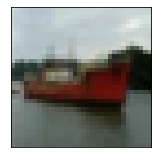

label: ship confidence: 0.9999877

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

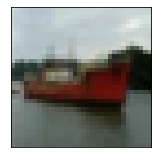

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


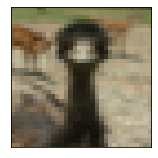

label: bird confidence: 0.996635

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

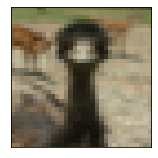

label: bird confidence: 0.996635

With  spatial_smoothing defense applied

BEFORE DEFENSE


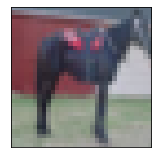

label: horse confidence: 0.99977845

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

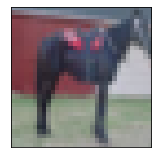

label: horse confidence: 0.99977845

With  thermometer_encoding defense applied

BEFORE DEFENSE


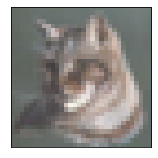

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

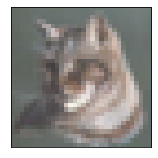

label: cat confidence: 0.9807608

With  variance_minimization defense applied

BEFORE DEFENSE


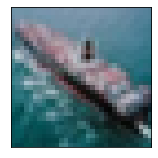

label: ship confidence: 0.99998987

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

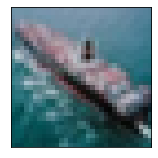

label: ship confidence: 0.99998987

With  reverse_sigmoid defense applied

BEFORE DEFENSE


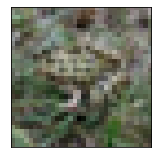

label: frog confidence: 0.99995065

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

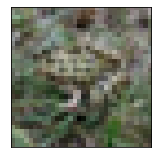

label: frog confidence: 0.22523494

With  rounded defense applied

BEFORE DEFENSE


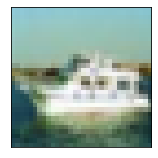

label: ship confidence: 0.99992526

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

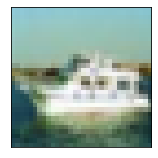

label: ship confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


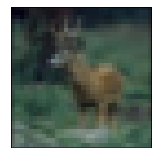

label: deer confidence: 0.9999782

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

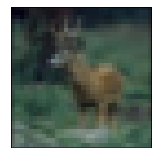

label: deer confidence: 0.9999782

With  evasion defense applied

BEFORE DEFENSE


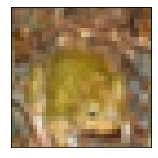

label: frog confidence: 0.9958586

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

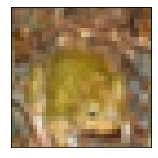

label: frog confidence: 0.9958586

With  0, std=1 defense applied

BEFORE DEFENSE


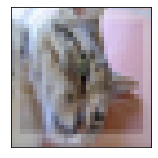

label: cat confidence: 0.863001

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   

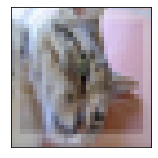

label: cat confidence: 0.863001

With  0, std=1 defense applied

BEFORE DEFENSE


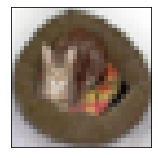

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

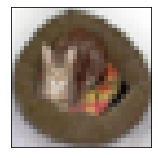

label: cat confidence: 0.9995546


In [24]:
elastic_net = ElasticNet(classifier=classifier,batch_size=32,max_iter=1,learning_rate=0.1,binary_search_steps=9,decision_rule='EN')
perform_attack(elastic_net_targeted, defenses)

Newton fool Attack


NewtonFool:   0%|          | 0/4 [00:00<?, ?it/s]


Attack effects on image

Before


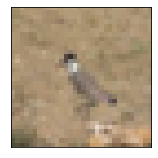

label: bird confidence: 0.99998426

After


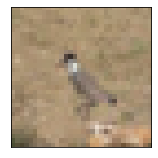

label: bird confidence: 0.862392

Before


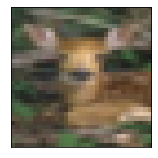

label: deer confidence: 0.99775934

After


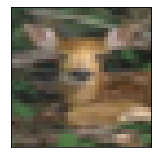

label: deer confidence: 0.55105364

Before


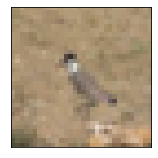

label: bird confidence: 0.99998426

After


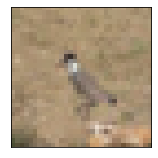

label: bird confidence: 0.862392

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0      

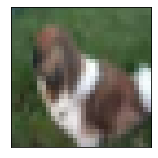

label: dog confidence: 0.99718434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

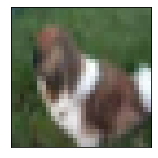

label: cat confidence: 0.9975629

With  label_smoothing defense applied

BEFORE DEFENSE


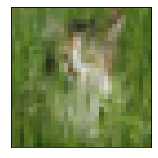

label: deer confidence: 0.7332446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

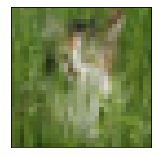

label: cat confidence: 0.89459497

With  class_labels defense applied

BEFORE DEFENSE


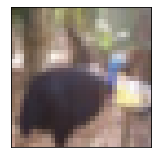

label: bird confidence: 0.9999994

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

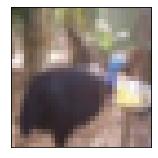

label: bird confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


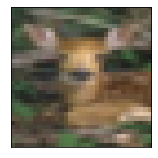

label: deer confidence: 0.99775934

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

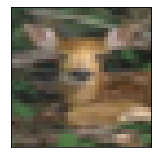

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


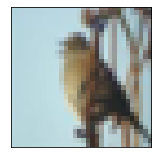

label: bird confidence: 0.9995498

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

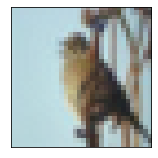

label: cat confidence: 0.99498403

With  spatial_smoothing defense applied

BEFORE DEFENSE


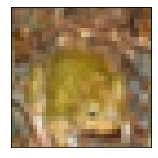

label: frog confidence: 0.9958586

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

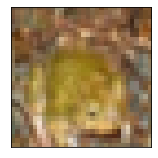

label: deer confidence: 0.9979954

With  thermometer_encoding defense applied

BEFORE DEFENSE


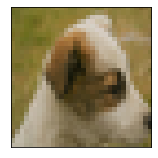

label: cat confidence: 0.5308168

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

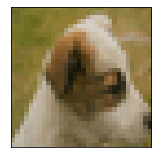

label: dog confidence: 0.78685415

With  variance_minimization defense applied

BEFORE DEFENSE


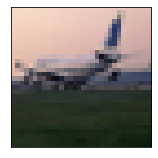

label: airplane confidence: 0.9999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      

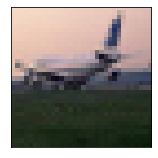

label: airplane confidence: 0.99322987

With  reverse_sigmoid defense applied

BEFORE DEFENSE


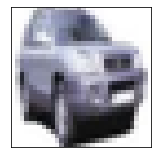

label: automobile confidence: 0.99980277

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20   

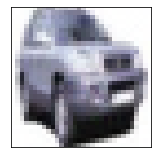

label: automobile confidence: 0.31769678

With  rounded defense applied

BEFORE DEFENSE


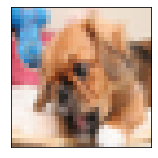

label: dog confidence: 0.99961483

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

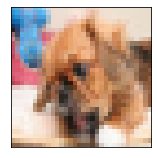

label: cat confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


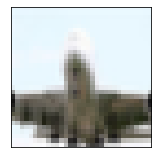

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0

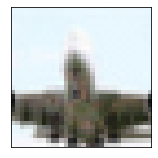

label: truck confidence: 0.9993369

With  evasion defense applied

BEFORE DEFENSE


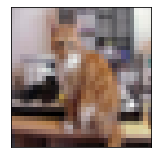

label: cat confidence: 0.99966383

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

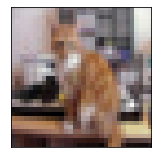

label: horse confidence: 0.5081379

With  0, std=1 defense applied

BEFORE DEFENSE


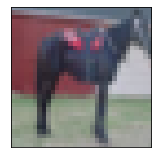

label: horse confidence: 0.99977845

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.

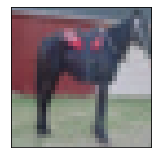

label: horse confidence: 0.9882953

With  0, std=1 defense applied

BEFORE DEFENSE


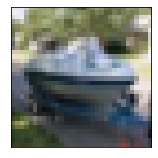

label: ship confidence: 0.999342

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.48 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

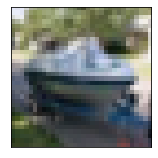

label: airplane confidence: 0.98102313


In [25]:
from art.attacks.evasion import NewtonFool

newton_fool = NewtonFool(classifier=classifier,batch_size=32,max_iter=1)

perform_attack(newton_fool, defenses)

Fast Gradient Method


Attack effects on image

Before


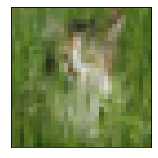

label: deer confidence: 0.7332446

After


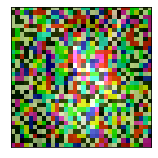

label: frog confidence: 0.40351847

Before


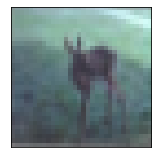

label: deer confidence: 0.99986434

After


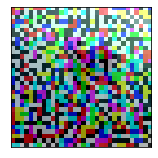

label: bird confidence: 0.95683306

Before


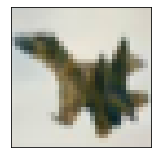

label: airplane confidence: 0.9943743

After


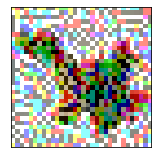

label: cat confidence: 0.7871718

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0      

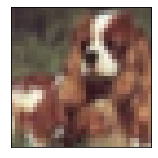

label: dog confidence: 0.9995395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

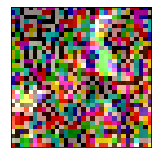

label: airplane confidence: 0.47179544

With  label_smoothing defense applied

BEFORE DEFENSE


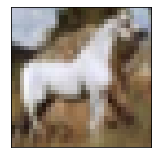

label: horse confidence: 0.99897206

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

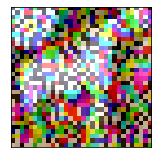

label: truck confidence: 0.7885509

With  class_labels defense applied

BEFORE DEFENSE


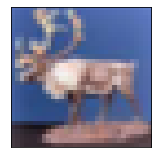

label: deer confidence: 0.9916221

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

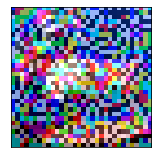

label: truck confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


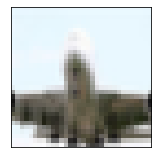

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.1

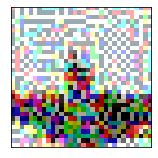

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


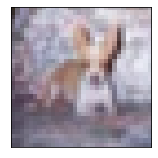

label: dog confidence: 0.8840677

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

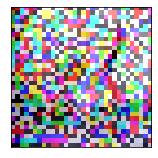

label: automobile confidence: 0.82621616

With  spatial_smoothing defense applied

BEFORE DEFENSE


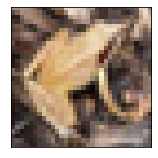

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

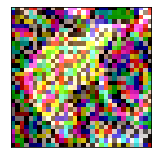

label: airplane confidence: 0.5673687

With  thermometer_encoding defense applied

BEFORE DEFENSE


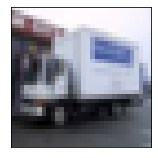

label: truck confidence: 0.99999976

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

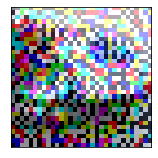

label: cat confidence: 0.45309156

With  variance_minimization defense applied

BEFORE DEFENSE


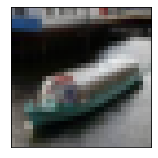

label: ship confidence: 0.99470395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

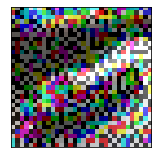

label: airplane confidence: 0.58115053

With  reverse_sigmoid defense applied

BEFORE DEFENSE


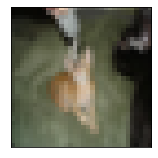

label: cat confidence: 0.9926327

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

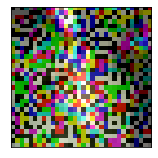

label: frog confidence: 0.33757433

With  rounded defense applied

BEFORE DEFENSE


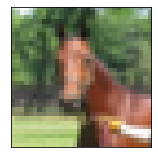

label: horse confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

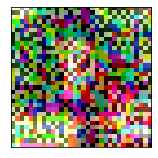

label: cat confidence: 0.36

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


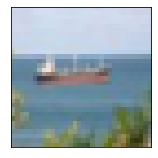

label: ship confidence: 0.99995315

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

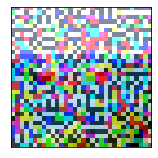

label: truck confidence: 0.4863444

With  evasion defense applied

BEFORE DEFENSE


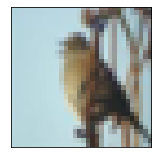

label: bird confidence: 0.9995498

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

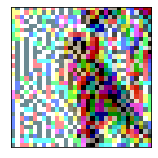

label: truck confidence: 0.89674217

With  0, std=1 defense applied

BEFORE DEFENSE


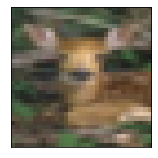

label: deer confidence: 0.99775934

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

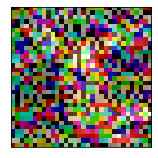

label: truck confidence: 0.54604566

With  0, std=1 defense applied

BEFORE DEFENSE


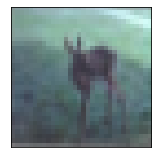

label: deer confidence: 0.99986434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

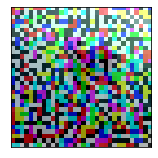

label: bird confidence: 0.95683306

                                                 TARGETED ATTACK                                                


Attack effects on image

Before


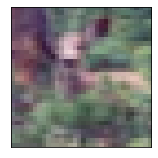

label: deer confidence: 0.9994727

After


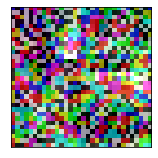

label: airplane confidence: 0.6930463

Before


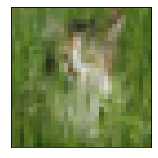

label: deer confidence: 0.7332446

After


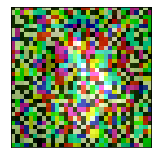

label: bird confidence: 0.6270441

Before


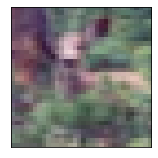

label: deer confidence: 0.9994727

After


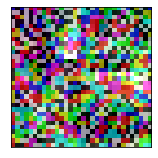

label: airplane confidence: 0.6930463

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0  

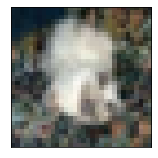

label: frog confidence: 0.5888467

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

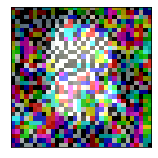

label: cat confidence: 0.4873813

With  label_smoothing defense applied

BEFORE DEFENSE


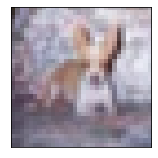

label: dog confidence: 0.8840677

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21  

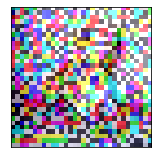

label: cat confidence: 0.30668348

With  class_labels defense applied

BEFORE DEFENSE


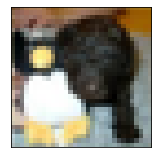

label: dog confidence: 0.8305685

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

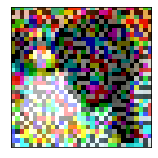

label: bird confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


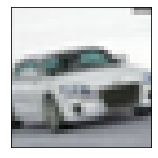

label: automobile confidence: 0.99968743

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00     

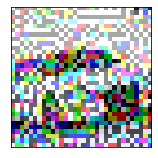

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


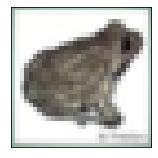

label: frog confidence: 0.99719065

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

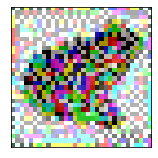

label: cat confidence: 0.93306404

With  spatial_smoothing defense applied

BEFORE DEFENSE


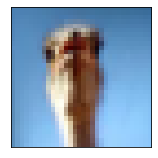

label: bird confidence: 0.99970514

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

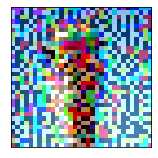

label: truck confidence: 0.51342154

With  thermometer_encoding defense applied

BEFORE DEFENSE


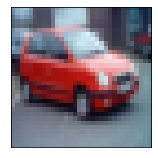

label: automobile confidence: 0.99999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20    

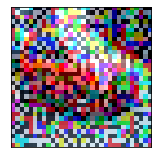

label: truck confidence: 0.78354573

With  variance_minimization defense applied

BEFORE DEFENSE


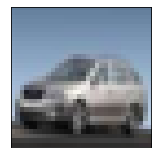

label: automobile confidence: 0.99995446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20    

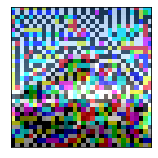

label: cat confidence: 0.5267936

With  reverse_sigmoid defense applied

BEFORE DEFENSE


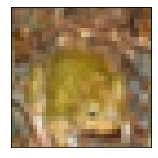

label: frog confidence: 0.9958586

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

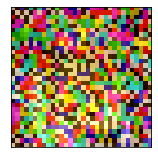

label: frog confidence: 0.2841601

With  rounded defense applied

BEFORE DEFENSE


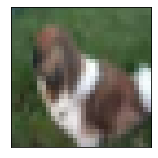

label: dog confidence: 0.99718434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21

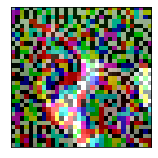

label: bird confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


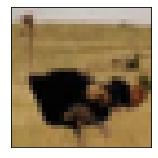

label: bird confidence: 0.9998702

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

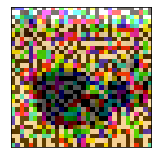

label: frog confidence: 0.5907796

With  evasion defense applied

BEFORE DEFENSE


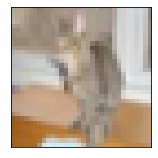

label: cat confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

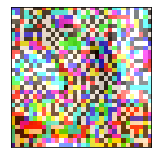

label: truck confidence: 0.9767278

With  0, std=1 defense applied

BEFORE DEFENSE


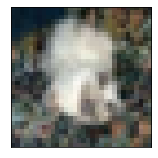

label: frog confidence: 0.5888467

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20      0.21 

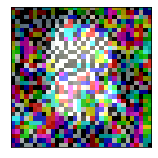

label: cat confidence: 0.4873813

With  0, std=1 defense applied

BEFORE DEFENSE


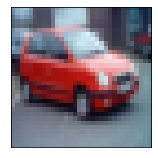

label: automobile confidence: 0.99999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.22      0.20    

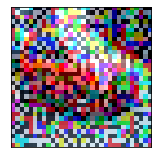

label: truck confidence: 0.78354573


In [26]:
from art.attacks.evasion import FastGradientMethod
fast_gradient_method = FastGradientMethod(estimator=classifier,batch_size=32)
fast_gradient_method_targeted = FastGradientMethod(estimator=classifier,batch_size=32,targeted=True)
perform_attack(fast_gradient_method, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')
perform_attack(fast_gradient_method_targeted, defenses)

Basic iterative Attack

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


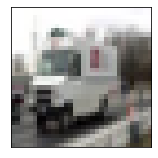

label: truck confidence: 0.99987054

After


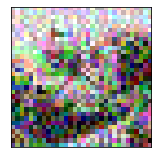

label: frog confidence: 1.0

Before


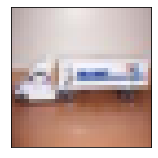

label: truck confidence: 0.9999751

After


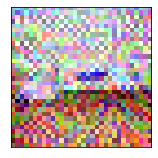

label: airplane confidence: 1.0

Before


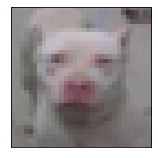

label: dog confidence: 0.99814594

After


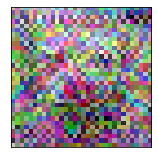

label: airplane confidence: 1.0

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0

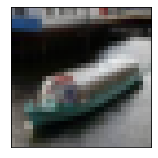

label: ship confidence: 0.99470395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

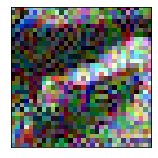

label: bird confidence: 0.99999845

With  label_smoothing defense applied

BEFORE DEFENSE


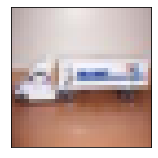

label: truck confidence: 0.9999751

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

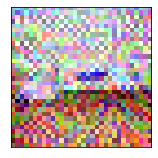

label: airplane confidence: 1.0

With  class_labels defense applied

BEFORE DEFENSE


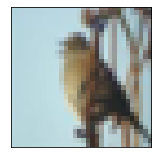

label: bird confidence: 0.9995498

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

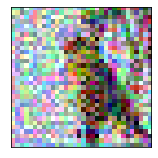

label: cat confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


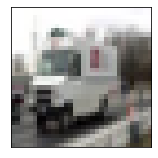

label: truck confidence: 0.99987054

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.10      0.60      0.1

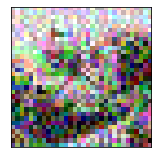

label: frog confidence: 1.0

With  feature_squeezing defense applied

BEFORE DEFENSE


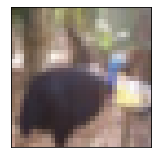

label: bird confidence: 0.9999994

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

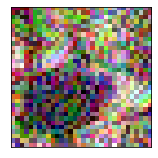

label: frog confidence: 0.9999999

With  spatial_smoothing defense applied

BEFORE DEFENSE


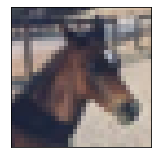

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

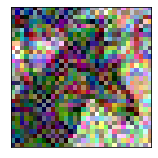

label: bird confidence: 0.9999982

With  thermometer_encoding defense applied

BEFORE DEFENSE


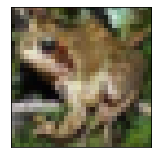

label: frog confidence: 0.9986563

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

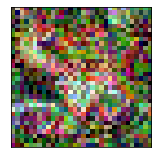

label: deer confidence: 0.9999999

With  variance_minimization defense applied

BEFORE DEFENSE


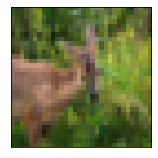

label: deer confidence: 0.99969685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

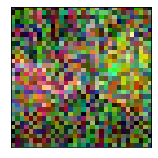

label: bird confidence: 1.0

With  reverse_sigmoid defense applied

BEFORE DEFENSE


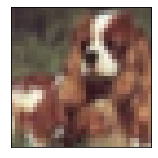

label: dog confidence: 0.9995395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

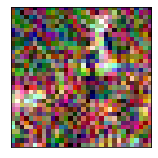

label: frog confidence: 0.12855546

With  rounded defense applied

BEFORE DEFENSE


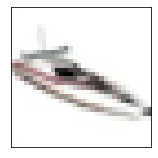

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

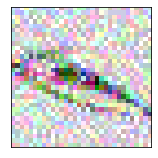

label: airplane confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


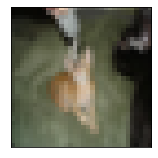

label: cat confidence: 0.9926327

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

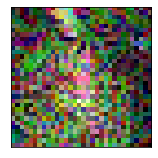

label: frog confidence: 1.0

With  evasion defense applied

BEFORE DEFENSE


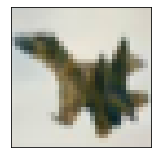

label: airplane confidence: 0.9943743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0

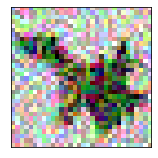

label: frog confidence: 0.9999999

With  0, std=1 defense applied

BEFORE DEFENSE


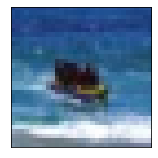

label: ship confidence: 0.42085823

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

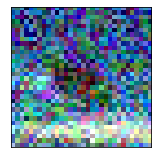

label: bird confidence: 0.99969316

With  0, std=1 defense applied

BEFORE DEFENSE


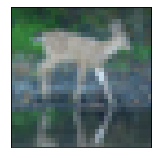

label: deer confidence: 0.9998369

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

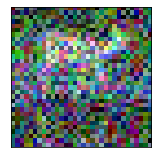

label: bird confidence: 0.9997497

                                                 TARGETED ATTACK                                                



PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


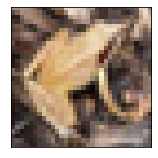

label: frog confidence: 0.955936

After


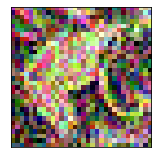

label: frog confidence: 1.0

Before


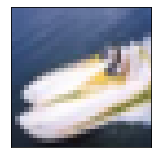

label: ship confidence: 0.9999528

After


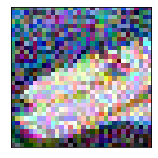

label: ship confidence: 0.9999995

Before


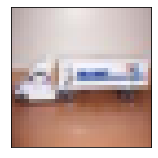

label: truck confidence: 0.9999751

After


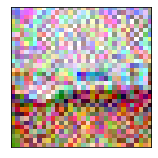

label: truck confidence: 1.0

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00

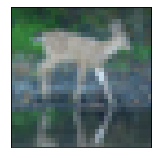

label: deer confidence: 0.9998369

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

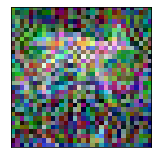

label: deer confidence: 0.99999976

With  label_smoothing defense applied

BEFORE DEFENSE


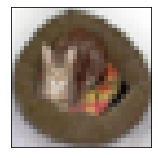

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

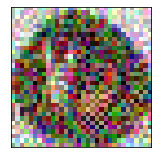

label: cat confidence: 0.999553

With  class_labels defense applied

BEFORE DEFENSE


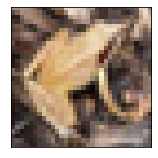

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

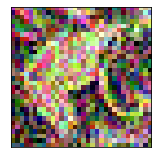

label: frog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


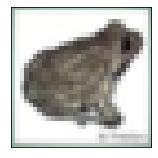

label: frog confidence: 0.99719065

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.56 
               precision    recall  f1-score   support

           0       0.19      1.00      0.31

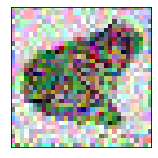

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


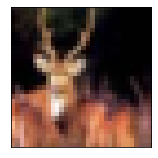

label: deer confidence: 0.99875915

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

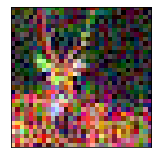

label: deer confidence: 0.9999974

With  spatial_smoothing defense applied

BEFORE DEFENSE


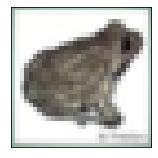

label: frog confidence: 0.99719065

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

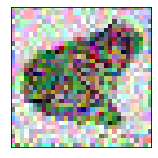

label: frog confidence: 0.9999902

With  thermometer_encoding defense applied

BEFORE DEFENSE


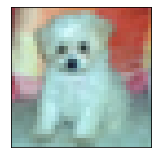

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

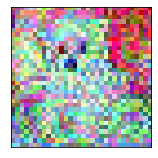

label: dog confidence: 1.0

With  variance_minimization defense applied

BEFORE DEFENSE


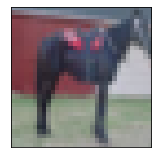

label: horse confidence: 0.99977845

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

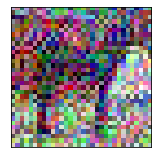

label: horse confidence: 1.0

With  reverse_sigmoid defense applied

BEFORE DEFENSE


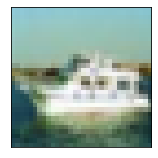

label: ship confidence: 0.99992526

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

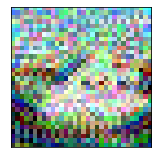

label: ship confidence: 0.16443747

With  rounded defense applied

BEFORE DEFENSE


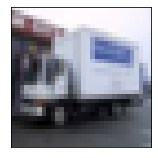

label: truck confidence: 0.99999976

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

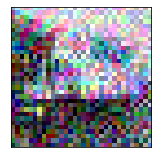

label: truck confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


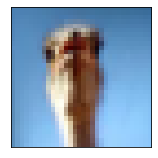

label: bird confidence: 0.99970514

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

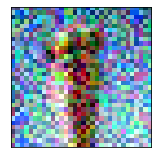

label: bird confidence: 1.0

With  evasion defense applied

BEFORE DEFENSE


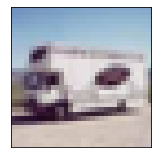

label: truck confidence: 0.9992285

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

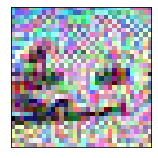

label: truck confidence: 1.0

With  0, std=1 defense applied

BEFORE DEFENSE


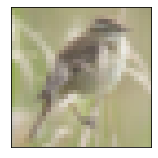

label: bird confidence: 0.9998896

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

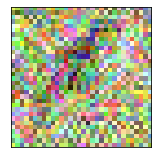

label: bird confidence: 0.9999963

With  0, std=1 defense applied

BEFORE DEFENSE


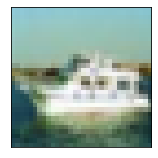

label: ship confidence: 0.99992526

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

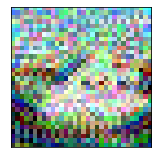

label: ship confidence: 0.9999999


In [27]:
from art.attacks.evasion import BasicIterativeMethod

basic_iterative = BasicIterativeMethod(estimator=classifier,batch_size=32)
basic_iterative_targeted = BasicIterativeMethod(estimator=classifier,batch_size=32,targeted=True)

perform_attack(basic_iterative, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(basic_iterative_targeted, defenses)

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


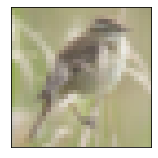

label: bird confidence: 0.9998896

After


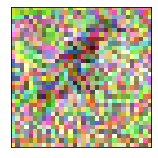

label: frog confidence: 0.9999999

Before


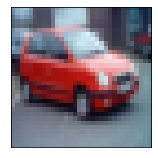

label: automobile confidence: 0.99999547

After


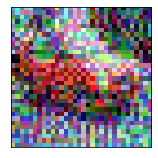

label: deer confidence: 1.0

Before


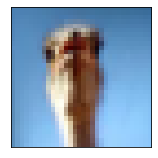

label: bird confidence: 0.99970514

After


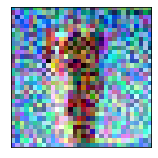

label: cat confidence: 0.99999857

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0      

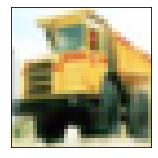

label: truck confidence: 0.99998355

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

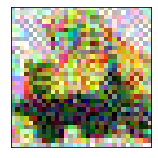

label: bird confidence: 0.9999994

With  label_smoothing defense applied

BEFORE DEFENSE


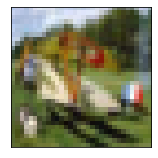

label: airplane confidence: 0.9977034

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0

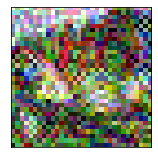

label: bird confidence: 1.0

With  class_labels defense applied

BEFORE DEFENSE


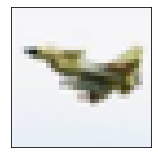

label: airplane confidence: 0.9999666

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.

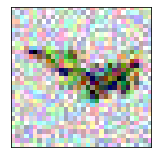

label: frog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


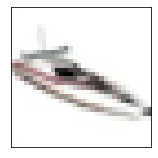

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.11      0.70      0.19

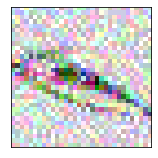

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


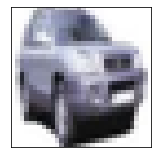

label: automobile confidence: 0.99980277

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00    

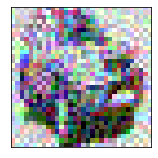

label: bird confidence: 1.0

With  spatial_smoothing defense applied

BEFORE DEFENSE


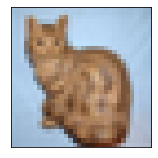

label: cat confidence: 0.99942636

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

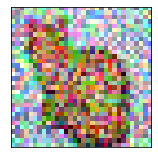

label: frog confidence: 0.99997723

With  thermometer_encoding defense applied

BEFORE DEFENSE


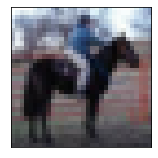

label: horse confidence: 0.9999865

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

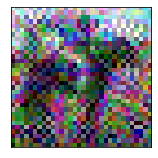

label: airplane confidence: 0.99999905

With  variance_minimization defense applied

BEFORE DEFENSE


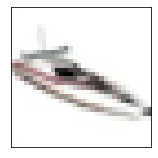

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

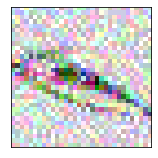

label: airplane confidence: 0.9998871

With  reverse_sigmoid defense applied

BEFORE DEFENSE


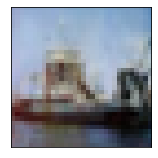

label: ship confidence: 0.9998846

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

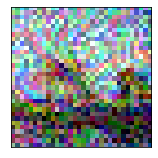

label: bird confidence: 0.12658727

With  rounded defense applied

BEFORE DEFENSE


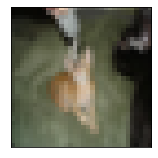

label: cat confidence: 0.9926327

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

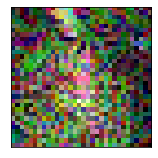

label: frog confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


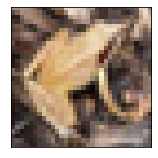

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

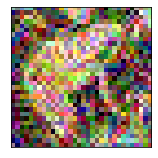

label: bird confidence: 1.0

With  evasion defense applied

BEFORE DEFENSE


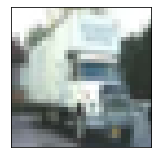

label: truck confidence: 0.9999851

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

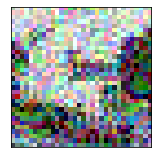

label: frog confidence: 0.99999917

With  0, std=1 defense applied

BEFORE DEFENSE


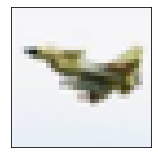

label: airplane confidence: 0.9999666

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0

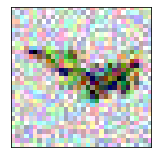

label: frog confidence: 0.9986713

With  0, std=1 defense applied

BEFORE DEFENSE


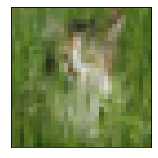

label: deer confidence: 0.7332446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

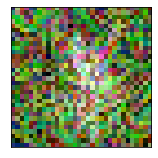

label: frog confidence: 1.0


In [28]:
basic_iterative = BasicIterativeMethod(estimator=classifier,batch_size=32,eps=0.3)
perform_attack(basic_iterative, defenses)

Deep fool attack

DeepFool:   0%|          | 0/4 [00:00<?, ?it/s]


Attack effects on image

Before


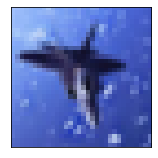

label: airplane confidence: 0.999987

After


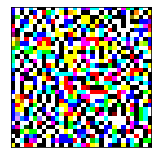

label: horse confidence: 1.0

Before


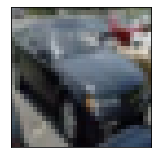

label: automobile confidence: 0.99994266

After


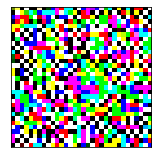

label: horse confidence: 1.0

Before


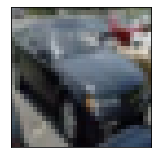

label: automobile confidence: 0.99994266

After


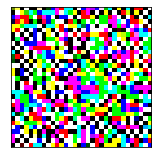

label: horse confidence: 1.0

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

performance on adversarial examples:
 Accuracy: 0.01 
               precision    recall  f1-score   support

           0       0.0

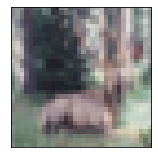

label: deer confidence: 0.9803345

Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.01 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

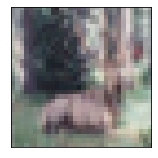

label: cat confidence: 0.9819597

With  label_smoothing defense applied

BEFORE DEFENSE


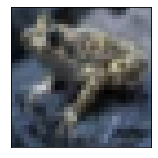

label: frog confidence: 0.9991872



Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.01 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.00

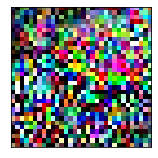

label: truck confidence: 0.6877531

With  class_labels defense applied

BEFORE DEFENSE


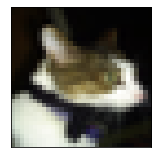

label: cat confidence: 0.99184364



Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00  

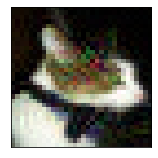

label: bird confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


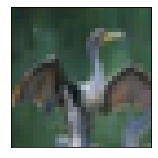

label: bird confidence: 0.91355854

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.07 
               precision    recall  f1-score   support

           0       0.08      0.70      0.15

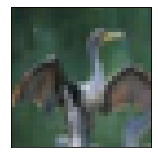

label: airplane confidence: 0.0


In [ ]:
from art.attacks.evasion import DeepFool

deep_fool = DeepFool(classifier=classifier,batch_size=32,max_iter=5)

perform_attack(deep_fool, defenses)


Carlini & Wagner (C&W) L_2 and L_inf attack


In [ ]:
from art.attacks.evasion import CarliniL2Method
carlini_l2 = CarliniL2Method(classifier=classifier,batch_size=32)
carlini_l2_targeted = CarliniL2Method(classifier=classifier,batch_size=32,targeted=True)
perform_attack(carlini_l2, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')
perform_attack(carlini_l2_targeted, defenses)

C&W L_2:   0%|          | 0/4 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
from art.attacks.evasion import CarliniLInfMethod

carlini_linf = CarliniLInfMethod(classifier=classifier,batch_size=50)
carlini_linf_targeted = CarliniLInfMethod(classifier=classifier,batch_size=50,targeted=True)


perform_attack(carlini_linf, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')


perform_attack(carlini_linf_targeted, defenses)

C&W L_inf:   0%|          | 0/2 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

Project Gradient Attack


PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


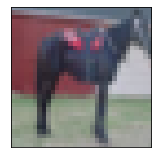

label: horse confidence: 0.99977845

After


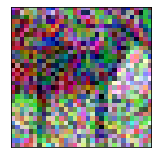

label: frog confidence: 1.0

Before


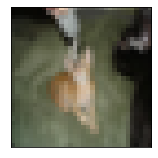

label: cat confidence: 0.9926327

After


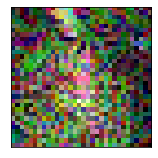

label: frog confidence: 1.0

Before


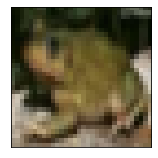

label: frog confidence: 0.99988115

After


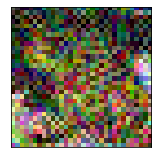

label: bird confidence: 0.9999999

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0      

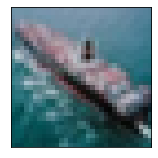

label: ship confidence: 0.99998987

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

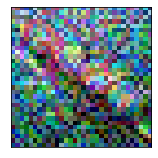

label: bird confidence: 1.0

With  label_smoothing defense applied

BEFORE DEFENSE


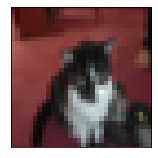

label: cat confidence: 0.9995685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

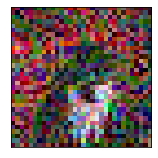

label: frog confidence: 0.9999988

With  class_labels defense applied

BEFORE DEFENSE


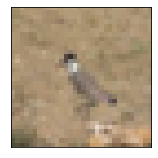

label: bird confidence: 0.99998426

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

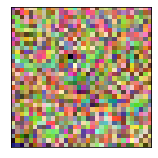

label: frog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


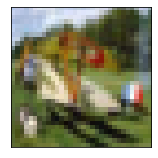

label: airplane confidence: 0.9977034

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.10      0.60      0

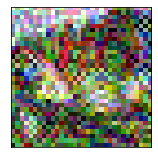

label: bird confidence: 1.0

With  feature_squeezing defense applied

BEFORE DEFENSE


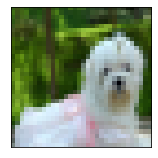

label: dog confidence: 0.99533075

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

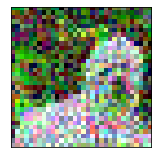

label: frog confidence: 0.99999964

With  spatial_smoothing defense applied

BEFORE DEFENSE


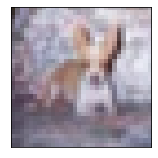

label: dog confidence: 0.8840677

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

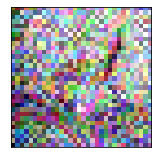

label: bird confidence: 1.0

With  thermometer_encoding defense applied

BEFORE DEFENSE


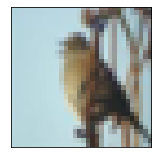

label: bird confidence: 0.9995498

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

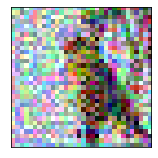

label: cat confidence: 0.9999999

With  variance_minimization defense applied

BEFORE DEFENSE


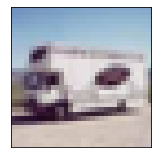

label: truck confidence: 0.9992285

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

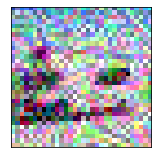

label: airplane confidence: 0.9999988

With  reverse_sigmoid defense applied

BEFORE DEFENSE


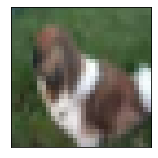

label: dog confidence: 0.99718434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

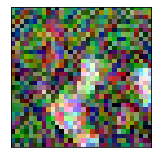

label: bird confidence: 0.22465232

With  rounded defense applied

BEFORE DEFENSE


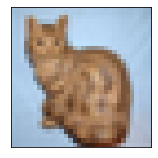

label: cat confidence: 0.99942636

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

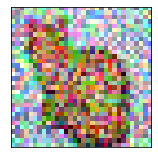

label: frog confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


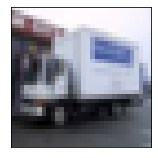

label: truck confidence: 0.99999976

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

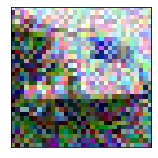

label: bird confidence: 0.99999845

With  evasion defense applied

BEFORE DEFENSE


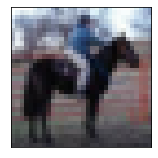

label: horse confidence: 0.9999865

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

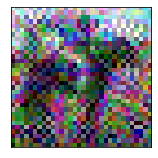

label: airplane confidence: 0.99999905

With  0, std=1 defense applied

BEFORE DEFENSE


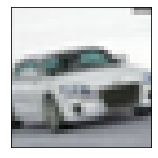

label: automobile confidence: 0.99968743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00    

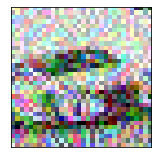

label: bird confidence: 0.9999957

With  0, std=1 defense applied

BEFORE DEFENSE


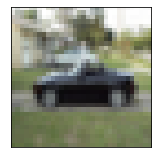

label: automobile confidence: 0.9999995

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00     

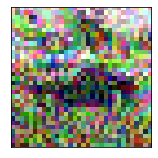

label: frog confidence: 1.0

                                                 TARGETED ATTACK                                                



PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


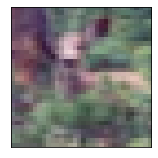

label: deer confidence: 0.9994727

After


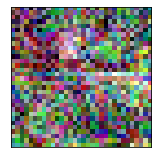

label: deer confidence: 0.9999919

Before


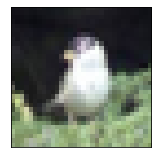

label: bird confidence: 0.99892396

After


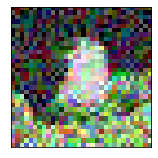

label: bird confidence: 0.99999905

Before


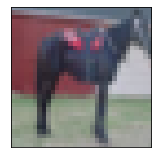

label: horse confidence: 0.99977845

After


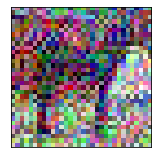

label: horse confidence: 1.0

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00

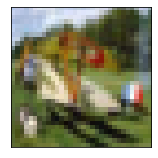

label: airplane confidence: 0.9977034

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1

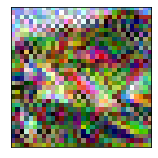

label: airplane confidence: 1.0

With  label_smoothing defense applied

BEFORE DEFENSE


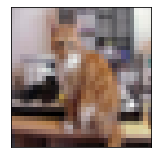

label: cat confidence: 0.99966383

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

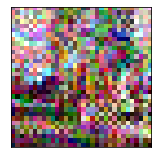

label: cat confidence: 1.0

With  class_labels defense applied

BEFORE DEFENSE


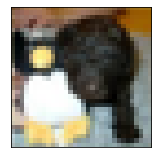

label: dog confidence: 0.8305685

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

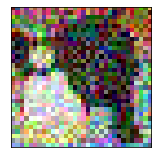

label: dog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


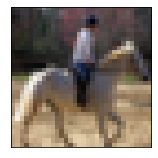

label: horse confidence: 0.9999925

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.57 
               precision    recall  f1-score   support

           0       0.19      1.00      0.32

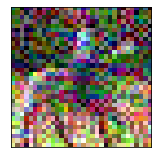

label: horse confidence: 1.0

With  feature_squeezing defense applied

BEFORE DEFENSE


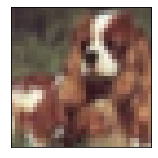

label: dog confidence: 0.9995395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

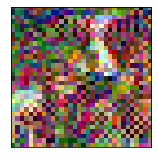

label: dog confidence: 0.9999999

With  spatial_smoothing defense applied

BEFORE DEFENSE


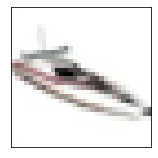

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

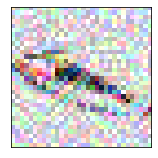

label: ship confidence: 0.9999988

With  thermometer_encoding defense applied

BEFORE DEFENSE


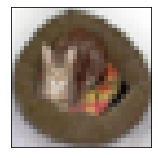

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

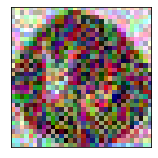

label: cat confidence: 0.9999943

With  variance_minimization defense applied

BEFORE DEFENSE


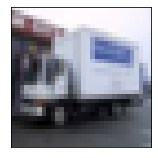

label: truck confidence: 0.99999976

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

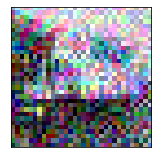

label: truck confidence: 1.0

With  reverse_sigmoid defense applied

BEFORE DEFENSE


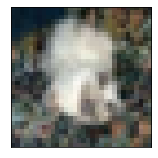

label: frog confidence: 0.5888467

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

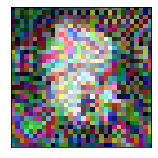

label: cat confidence: 0.12784417

With  rounded defense applied

BEFORE DEFENSE


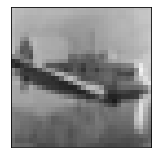

label: airplane confidence: 0.5892203

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1

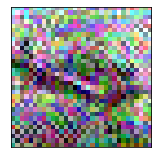

label: airplane confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


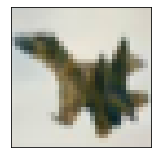

label: airplane confidence: 0.9943743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1

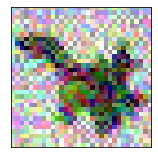

label: airplane confidence: 0.9999987

With  evasion defense applied

BEFORE DEFENSE


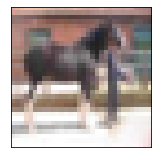

label: horse confidence: 0.9990916

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

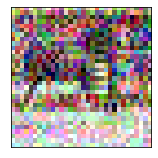

label: horse confidence: 1.0

With  0, std=1 defense applied

BEFORE DEFENSE


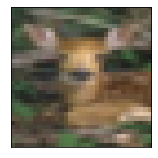

label: deer confidence: 0.99775934

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

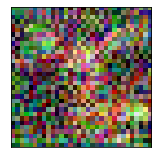

label: deer confidence: 1.0

With  0, std=1 defense applied

BEFORE DEFENSE


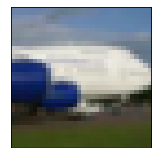

label: airplane confidence: 0.9999232

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1

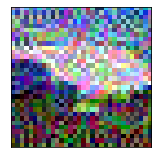

label: airplane confidence: 0.999984


In [29]:
from art.attacks.evasion import ProjectedGradientDescent

projected_gradient_descent = ProjectedGradientDescent(estimator=classifier,batch_size=32)
projected_gradient_descent_targeted = ProjectedGradientDescent(estimator=classifier,batch_size=32,targeted=True)

perform_attack(projected_gradient_descent, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(projected_gradient_descent_targeted, defenses)

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


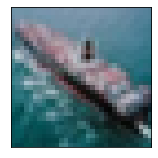

label: ship confidence: 0.99998987

After


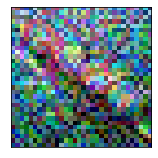

label: bird confidence: 1.0

Before


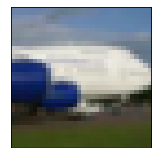

label: airplane confidence: 0.9999232

After


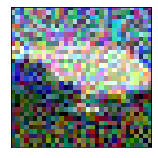

label: bird confidence: 1.0

Before


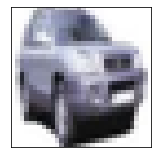

label: automobile confidence: 0.99980277

After


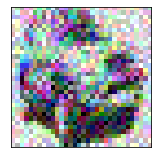

label: bird confidence: 0.99999976

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0     

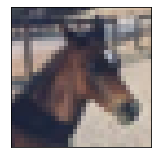

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

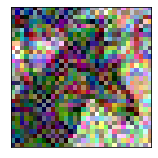

label: bird confidence: 0.9999982

With  label_smoothing defense applied

BEFORE DEFENSE


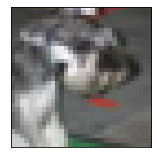

label: cat confidence: 0.9982356

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

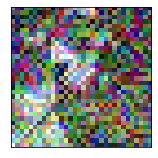

label: bird confidence: 0.9991793

With  class_labels defense applied

BEFORE DEFENSE


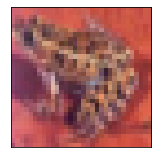

label: frog confidence: 0.99787664

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

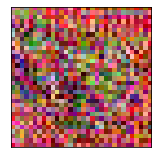

label: deer confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


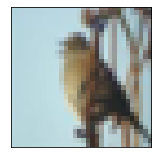

label: bird confidence: 0.9995498

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.05 
               precision    recall  f1-score   support

           0       0.08      0.50      0.14 

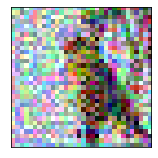

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


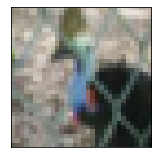

label: bird confidence: 0.99978894

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

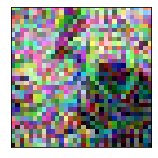

label: frog confidence: 0.99999976

With  spatial_smoothing defense applied

BEFORE DEFENSE


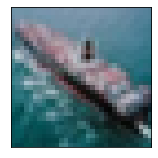

label: ship confidence: 0.99998987

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

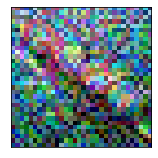

label: bird confidence: 1.0

With  thermometer_encoding defense applied

BEFORE DEFENSE


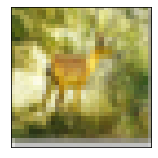

label: deer confidence: 0.9997727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

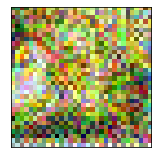

label: bird confidence: 1.0

With  variance_minimization defense applied

BEFORE DEFENSE


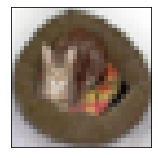

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

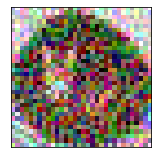

label: frog confidence: 0.99999225

With  reverse_sigmoid defense applied

BEFORE DEFENSE


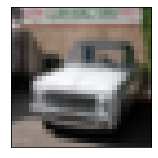

label: automobile confidence: 0.9934424

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00     

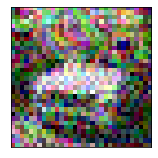

label: frog confidence: 0.12549947

With  rounded defense applied

BEFORE DEFENSE


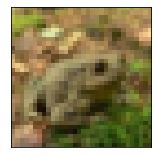

label: frog confidence: 0.9999113

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

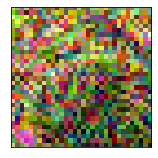

label: bird confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


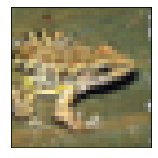

label: frog confidence: 0.9994697

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

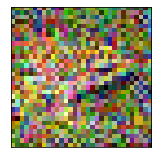

label: bird confidence: 1.0

With  evasion defense applied

BEFORE DEFENSE


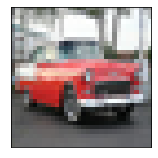

label: automobile confidence: 0.99957126

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00    

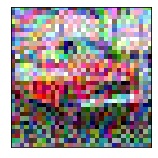

label: truck confidence: 0.99999976

With  0, std=1 defense applied

BEFORE DEFENSE


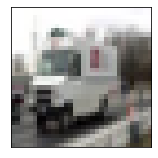

label: truck confidence: 0.99987054

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

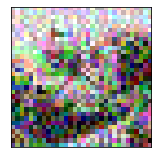

label: frog confidence: 1.0

With  0, std=1 defense applied

BEFORE DEFENSE


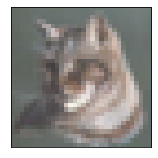

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

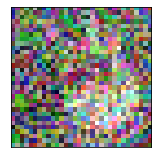

label: frog confidence: 1.0


In [30]:
projected_gradient_descent = ProjectedGradientDescent(estimator=classifier,batch_size=32,eps=0.3,eps_step=0.1)
perform_attack(projected_gradient_descent, defenses)

Jacobian Saliency Map Method

JSMA:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


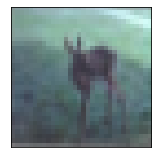

label: deer confidence: 0.99986434

After


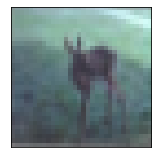

label: deer confidence: 0.99986434

Before


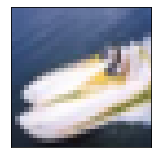

label: ship confidence: 0.9999528

After


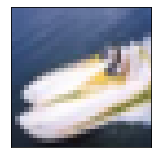

label: ship confidence: 0.9999528

Before


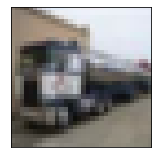

label: truck confidence: 0.9999819

After


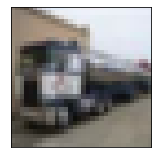

label: truck confidence: 0.9999819

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0     

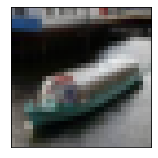

label: ship confidence: 0.99470395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

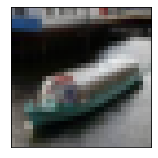

label: ship confidence: 0.99470395

With  label_smoothing defense applied

BEFORE DEFENSE


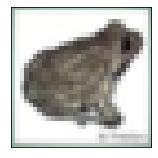

label: frog confidence: 0.99719065

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

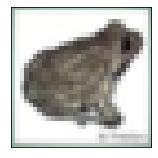

label: frog confidence: 0.99719065

With  class_labels defense applied

BEFORE DEFENSE


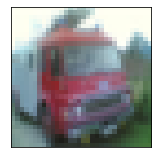

label: truck confidence: 0.9999789

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

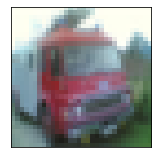

label: truck confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


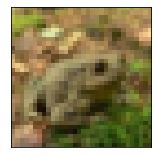

label: frog confidence: 0.9999113

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

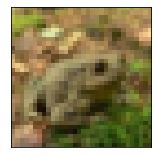

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


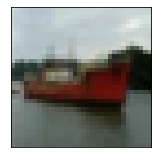

label: ship confidence: 0.9999877

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

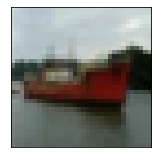

label: ship confidence: 0.9999877

With  spatial_smoothing defense applied

BEFORE DEFENSE


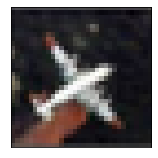

label: airplane confidence: 0.998519

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.

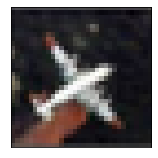

label: airplane confidence: 0.998519

With  thermometer_encoding defense applied

BEFORE DEFENSE


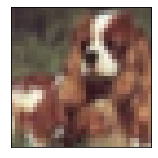

label: dog confidence: 0.9995395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

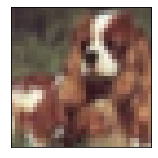

label: dog confidence: 0.9995395

With  variance_minimization defense applied

BEFORE DEFENSE


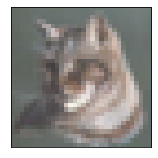

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

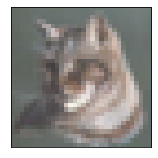

label: cat confidence: 0.9807608

With  reverse_sigmoid defense applied

BEFORE DEFENSE


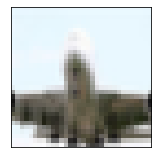

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.

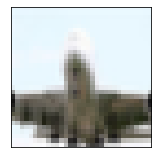

label: airplane confidence: 0.28125665

With  rounded defense applied

BEFORE DEFENSE


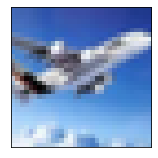

label: airplane confidence: 0.99992263

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      

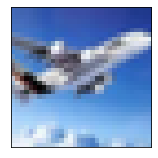

label: airplane confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


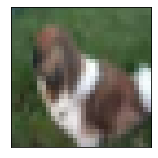

label: dog confidence: 0.99718434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

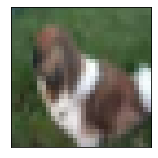

label: dog confidence: 0.99718434

With  evasion defense applied

BEFORE DEFENSE


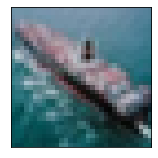

label: ship confidence: 0.99998987

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

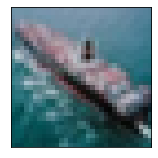

label: ship confidence: 0.99998987

With  0, std=1 defense applied

BEFORE DEFENSE


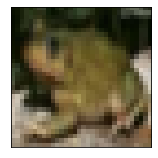

label: frog confidence: 0.99988115

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

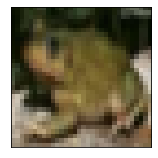

label: frog confidence: 0.99988115

With  0, std=1 defense applied

BEFORE DEFENSE


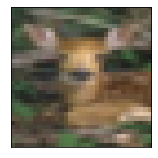

label: deer confidence: 0.99775934

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

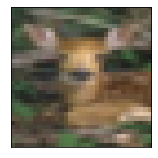

label: deer confidence: 0.99775934


In [31]:
from art.attacks.evasion import SaliencyMapMethod
saliency_map = SaliencyMapMethod(classifier=classifier)
perform_attack(saliency_map, defenses)

JSMA:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


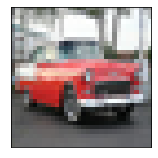

label: automobile confidence: 0.99957126

After


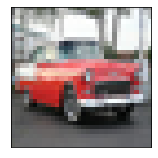

label: automobile confidence: 0.99957126

Before


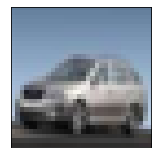

label: automobile confidence: 0.99995446

After


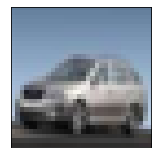

label: automobile confidence: 0.99995446

Before


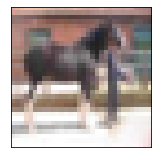

label: horse confidence: 0.9990916

After


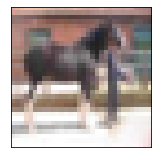

label: horse confidence: 0.9990916

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0     

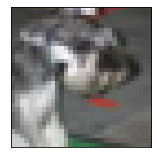

label: cat confidence: 0.9982356

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

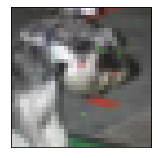

label: dog confidence: 0.72831017

With  label_smoothing defense applied

BEFORE DEFENSE


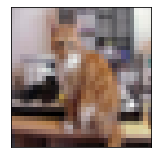

label: cat confidence: 0.99966383

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

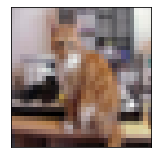

label: cat confidence: 0.99966383

With  class_labels defense applied

BEFORE DEFENSE


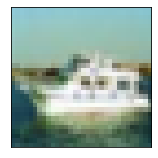

label: ship confidence: 0.99992526

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

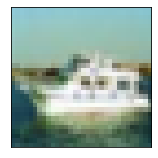

label: ship confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


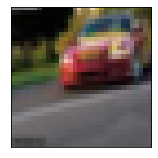

label: automobile confidence: 0.99881977

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00     

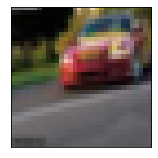

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


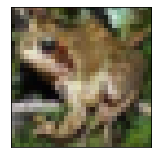

label: frog confidence: 0.9986563

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

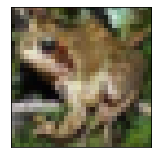

label: frog confidence: 0.9986563

With  spatial_smoothing defense applied

BEFORE DEFENSE


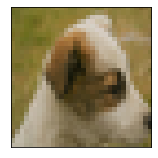

label: cat confidence: 0.5308168

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

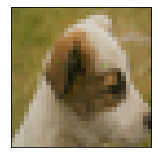

label: dog confidence: 0.6849572

With  thermometer_encoding defense applied

BEFORE DEFENSE


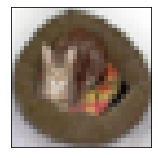

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

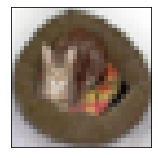

label: cat confidence: 0.9995546

With  variance_minimization defense applied

BEFORE DEFENSE


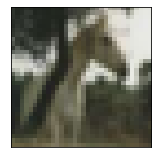

label: horse confidence: 0.89230114

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.0

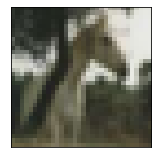

label: horse confidence: 0.89230114

With  reverse_sigmoid defense applied

BEFORE DEFENSE


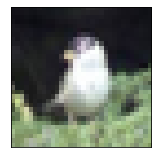

label: bird confidence: 0.99892396

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

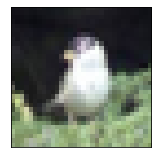

label: bird confidence: 0.28112316

With  rounded defense applied

BEFORE DEFENSE


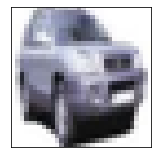

label: automobile confidence: 0.99980277

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00    

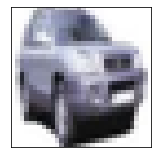

label: automobile confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


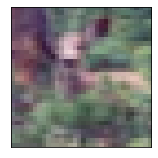

label: deer confidence: 0.9994727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00 

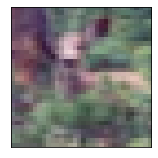

label: deer confidence: 0.9994727

With  evasion defense applied

BEFORE DEFENSE


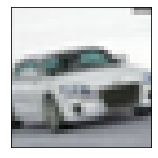

label: automobile confidence: 0.99968743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00    

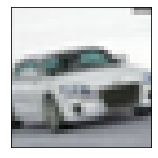

label: automobile confidence: 0.99968743

With  0, std=1 defense applied

BEFORE DEFENSE


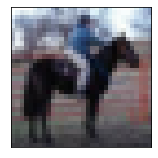

label: horse confidence: 0.9999865

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00

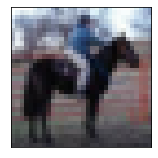

label: horse confidence: 0.9999865

With  0, std=1 defense applied

BEFORE DEFENSE


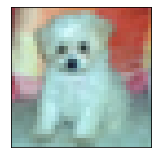

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 1.0 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00  

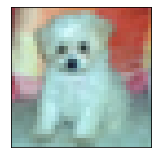

label: dog confidence: 0.9996018


In [32]:
saliency_map = SaliencyMapMethod(classifier=classifier,theta=0.1)
perform_attack(saliency_map, defenses)

Universal Pertubation Attack

Universal perturbation:   0%|          | 0/20 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]


Attack effects on image

Before


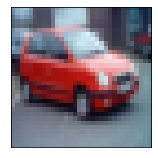

label: automobile confidence: 0.99999547

After


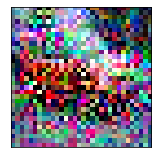

label: truck confidence: 0.6122345

Before


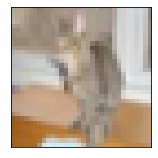

label: cat confidence: 0.99998045

After


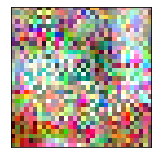

label: automobile confidence: 0.62423074

Before


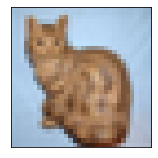

label: cat confidence: 0.99942636

After


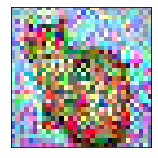

label: truck confidence: 0.7015185

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0    

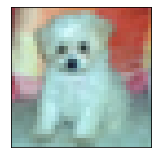

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

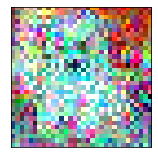

label: automobile confidence: 0.38362184

With  label_smoothing defense applied

BEFORE DEFENSE


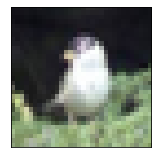

label: bird confidence: 0.99892396

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

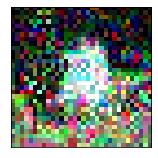

label: airplane confidence: 0.36524355

With  class_labels defense applied

BEFORE DEFENSE


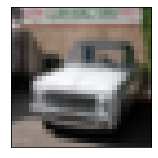

label: automobile confidence: 0.9934424

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      

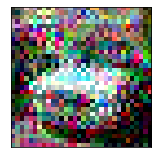

label: automobile confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


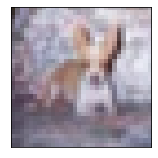

label: dog confidence: 0.8840677

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

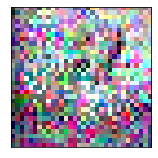

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


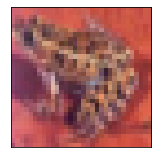

label: frog confidence: 0.99787664

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

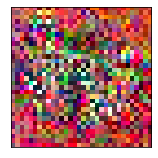

label: truck confidence: 0.8825648

With  spatial_smoothing defense applied

BEFORE DEFENSE


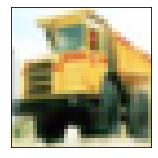

label: truck confidence: 0.99998355

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

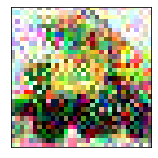

label: automobile confidence: 0.8611634

With  thermometer_encoding defense applied

BEFORE DEFENSE


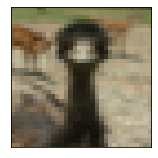

label: bird confidence: 0.996635

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

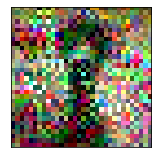

label: automobile confidence: 0.8087705

With  variance_minimization defense applied

BEFORE DEFENSE


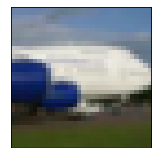

label: airplane confidence: 0.9999232

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      

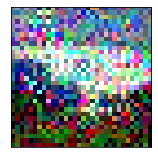

label: automobile confidence: 0.9840785

With  reverse_sigmoid defense applied

BEFORE DEFENSE


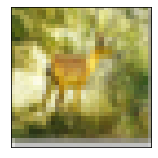

label: deer confidence: 0.9997727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

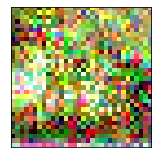

label: frog confidence: 0.21447952

With  rounded defense applied

BEFORE DEFENSE


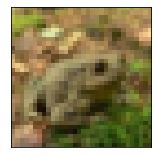

label: frog confidence: 0.9999113

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

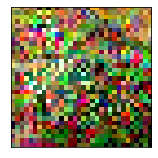

label: automobile confidence: 0.94

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


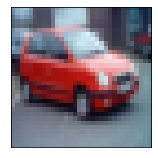

label: automobile confidence: 0.99999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00   

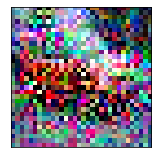

label: truck confidence: 0.6122345

With  evasion defense applied

BEFORE DEFENSE


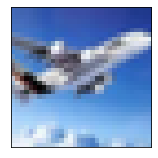

label: airplane confidence: 0.99992263

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00     

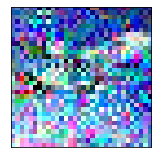

label: truck confidence: 0.49675652

With  0, std=1 defense applied

BEFORE DEFENSE


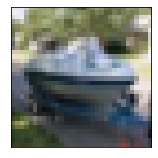

label: ship confidence: 0.999342

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

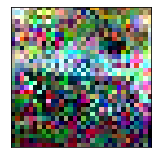

label: automobile confidence: 0.9682925

With  0, std=1 defense applied

BEFORE DEFENSE


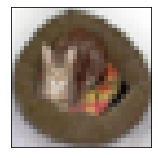

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.09 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

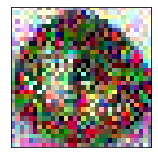

label: truck confidence: 0.5418769


In [33]:
from art.attacks.evasion import UniversalPerturbation

universal_perturbation = UniversalPerturbation(classifier=classifier)

perform_attack(universal_perturbation, defenses)

Universal perturbation:   0%|          | 0/20 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]


Attack effects on image

Before


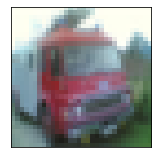

label: truck confidence: 0.9999789

After


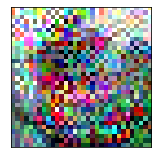

label: truck confidence: 0.90141803

Before


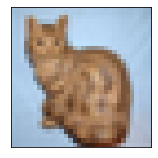

label: cat confidence: 0.99942636

After


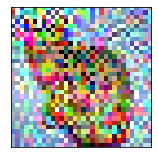

label: truck confidence: 0.83080006

Before


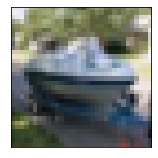

label: ship confidence: 0.999342

After


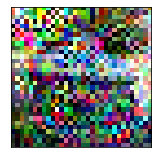

label: truck confidence: 0.71082187

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0   

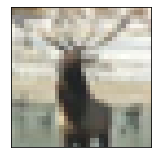

label: deer confidence: 0.95469046

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

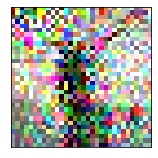

label: truck confidence: 0.8779516

With  label_smoothing defense applied

BEFORE DEFENSE


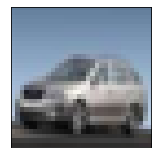

label: automobile confidence: 0.99995446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00   

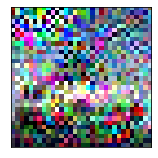

label: truck confidence: 0.9261016

With  class_labels defense applied

BEFORE DEFENSE


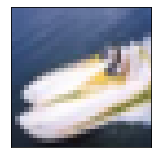

label: ship confidence: 0.9999528

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

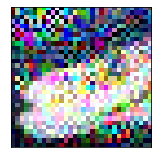

label: truck confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


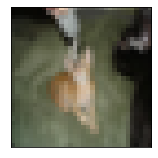

label: cat confidence: 0.9926327

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

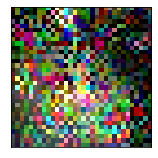

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


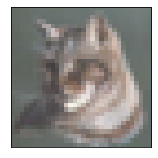

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

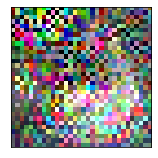

label: truck confidence: 0.94031316

With  spatial_smoothing defense applied

BEFORE DEFENSE


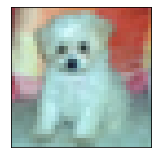

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

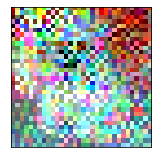

label: truck confidence: 0.7016917

With  thermometer_encoding defense applied

BEFORE DEFENSE


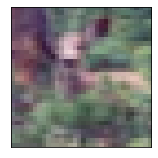

label: deer confidence: 0.9994727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

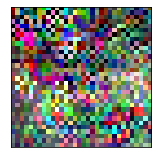

label: truck confidence: 0.7839187

With  variance_minimization defense applied

BEFORE DEFENSE


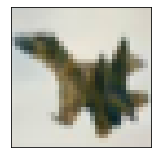

label: airplane confidence: 0.9943743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      

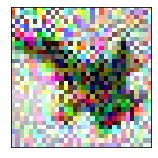

label: truck confidence: 0.6845132

With  reverse_sigmoid defense applied

BEFORE DEFENSE


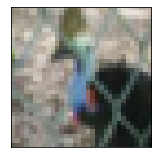

label: bird confidence: 0.99978894

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

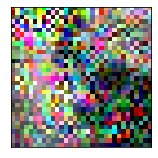

label: truck confidence: 0.32520735

With  rounded defense applied

BEFORE DEFENSE


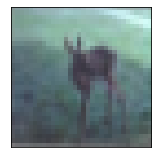

label: deer confidence: 0.99986434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

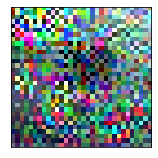

label: truck confidence: 0.86

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


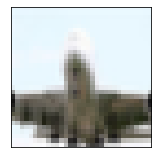

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0

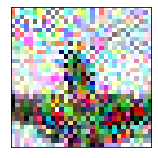

label: cat confidence: 0.6625102

With  evasion defense applied

BEFORE DEFENSE


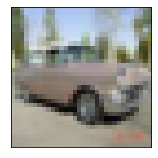

label: automobile confidence: 0.9994979

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00    

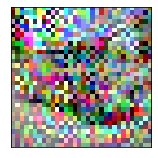

label: truck confidence: 0.9700608

With  0, std=1 defense applied

BEFORE DEFENSE


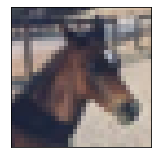

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

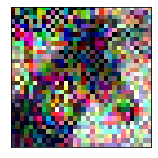

label: truck confidence: 0.98582876

With  0, std=1 defense applied

BEFORE DEFENSE


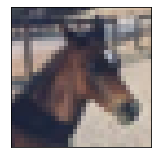

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.08 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

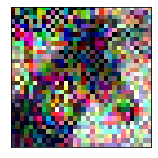

label: truck confidence: 0.98582876


In [34]:
universal_perturbation = UniversalPerturbation(classifier=classifier,delta=0.2)
perform_attack(universal_perturbation, defenses)

Auto attack

In [38]:
from numpy import inf
from art.attacks.evasion import ShadowAttack
auto_attack = ShadowAttack(estimator=classifier)
perform_attack(auto_attack, defenses)

ValueError: ignored

**Black box attacks
**

Zoo Attack

ZOO:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


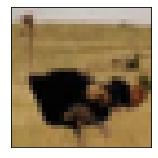

label: bird confidence: 0.9998702

After


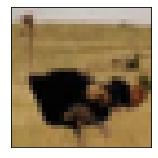

label: bird confidence: 0.9998702

Before


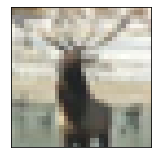

label: deer confidence: 0.95469046

After


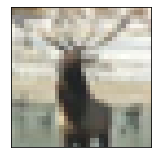

label: deer confidence: 0.95469046

Before


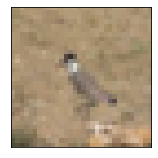

label: bird confidence: 0.99998426

After


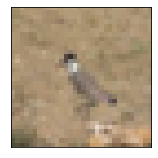

label: bird confidence: 0.99998426

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0    

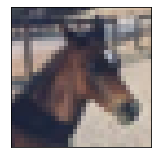

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89

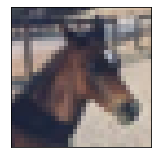

label: horse confidence: 0.999793

With  label_smoothing defense applied

BEFORE DEFENSE


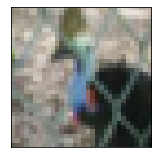

label: bird confidence: 0.99978894

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.8

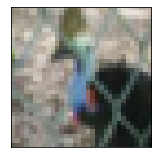

label: bird confidence: 0.99978894

With  class_labels defense applied

BEFORE DEFENSE


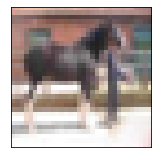

label: horse confidence: 0.9990916

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

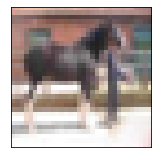

label: horse confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


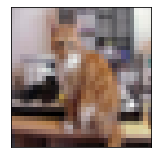

label: cat confidence: 0.99966383

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

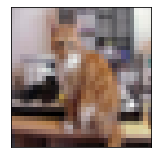

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


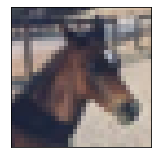

label: horse confidence: 0.999793

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89

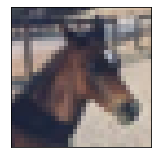

label: horse confidence: 0.999793

With  spatial_smoothing defense applied

BEFORE DEFENSE


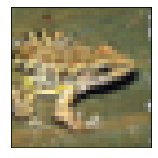

label: frog confidence: 0.9994697

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89

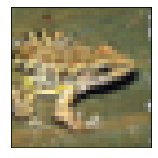

label: frog confidence: 0.9994697

With  thermometer_encoding defense applied

BEFORE DEFENSE


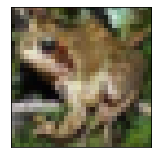

label: frog confidence: 0.9986563

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89

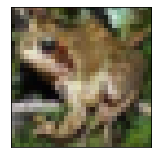

label: frog confidence: 0.9986563

With  variance_minimization defense applied

BEFORE DEFENSE


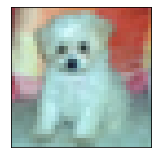

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89 

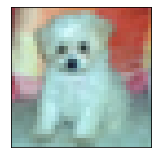

label: dog confidence: 0.9996018

With  reverse_sigmoid defense applied

BEFORE DEFENSE


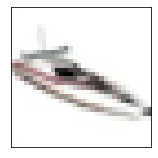

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.8

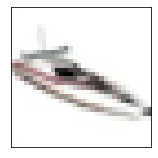

label: ship confidence: 0.24542427

With  rounded defense applied

BEFORE DEFENSE


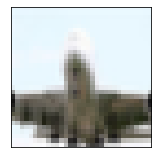

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0

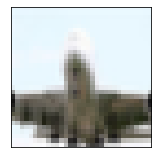

label: airplane confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


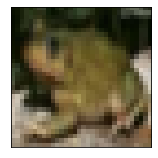

label: frog confidence: 0.99988115

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.8

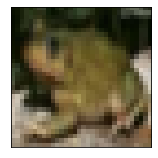

label: frog confidence: 0.99988115

With  evasion defense applied

BEFORE DEFENSE


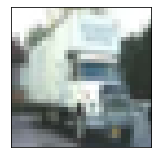

label: truck confidence: 0.9999851

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.8

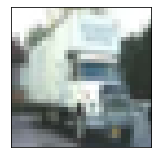

label: truck confidence: 0.9999851

With  0, std=1 defense applied

BEFORE DEFENSE


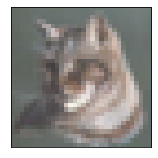

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89 

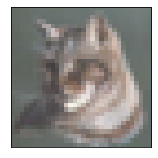

label: cat confidence: 0.9807608

With  0, std=1 defense applied

BEFORE DEFENSE


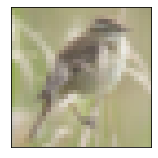

label: bird confidence: 0.9998896

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.93 
               precision    recall  f1-score   support

           0       1.00      0.80      0.89

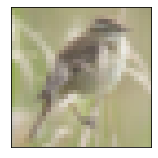

label: bird confidence: 0.9998896

                                                 TARGETED ATTACK                                                



ZOO:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


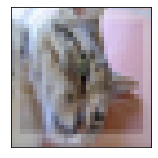

label: cat confidence: 0.863001

After


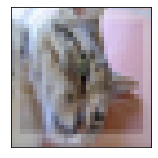

label: cat confidence: 0.863001

Before


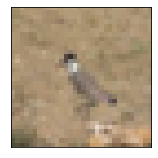

label: bird confidence: 0.99998426

After


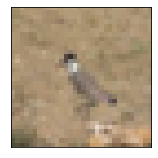

label: bird confidence: 0.99998426

Before


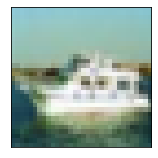

label: ship confidence: 0.99992526

After


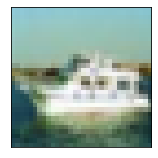

label: ship confidence: 0.99992526

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0    

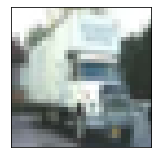

label: truck confidence: 0.9999851

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

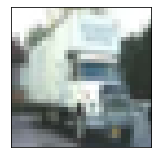

label: truck confidence: 0.9999851

With  label_smoothing defense applied

BEFORE DEFENSE


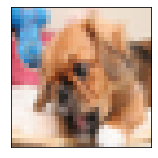

label: dog confidence: 0.99961483

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

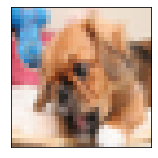

label: dog confidence: 0.99961483

With  class_labels defense applied

BEFORE DEFENSE


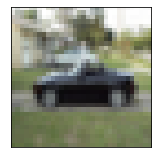

label: automobile confidence: 0.9999995

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      

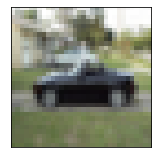

label: automobile confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


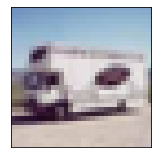

label: truck confidence: 0.9992285

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

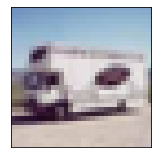

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


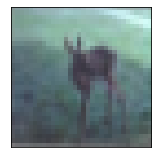

label: deer confidence: 0.99986434

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

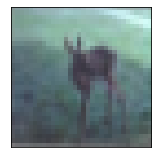

label: deer confidence: 0.99986434

With  spatial_smoothing defense applied

BEFORE DEFENSE


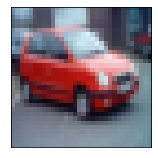

label: automobile confidence: 0.99999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90   

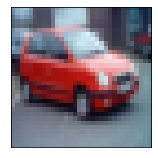

label: automobile confidence: 0.99999547

With  thermometer_encoding defense applied

BEFORE DEFENSE


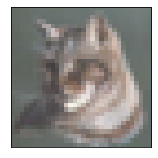

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95 

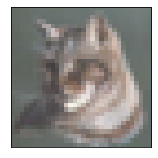

label: cat confidence: 0.9807608

With  variance_minimization defense applied

BEFORE DEFENSE


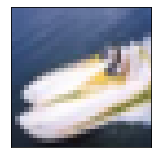

label: ship confidence: 0.9999528

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

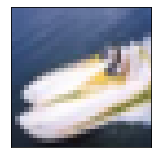

label: ship confidence: 0.9999528

With  reverse_sigmoid defense applied

BEFORE DEFENSE


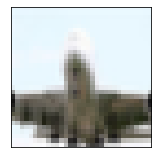

label: airplane confidence: 0.997783

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0

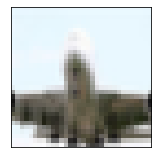

label: airplane confidence: 0.28125665

With  rounded defense applied

BEFORE DEFENSE


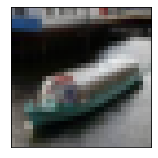

label: ship confidence: 0.99470395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

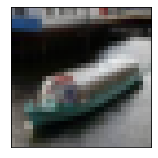

label: ship confidence: 0.99

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


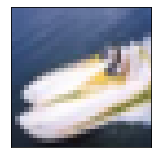

label: ship confidence: 0.9999528

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

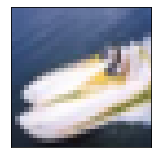

label: ship confidence: 0.9999528

With  evasion defense applied

BEFORE DEFENSE


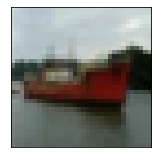

label: ship confidence: 0.9999877

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

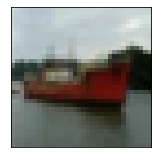

label: ship confidence: 0.9999877

With  0, std=1 defense applied

BEFORE DEFENSE


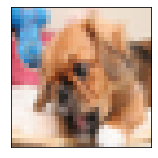

label: dog confidence: 0.99961483

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

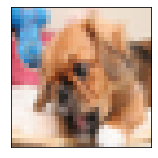

label: dog confidence: 0.99961483

With  0, std=1 defense applied

BEFORE DEFENSE


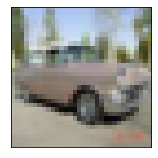

label: automobile confidence: 0.9994979

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.96 
               precision    recall  f1-score   support

           0       1.00      0.90    

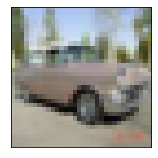

label: automobile confidence: 0.9994979


In [39]:
from art.attacks.evasion import ZooAttack

zoo_attack = ZooAttack(classifier=classifier, max_iter = 1, binary_search_steps=5)
zoo_attack_targeted = ZooAttack(classifier=classifier, max_iter = 1, binary_search_steps=5,targeted=True)


perform_attack(zoo_attack, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(zoo_attack_targeted, defenses)

Hop skip jump attack

HopSkipJump:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


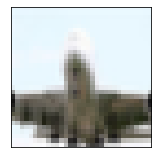

label: airplane confidence: 0.997783

After


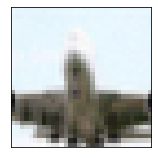

label: truck confidence: 0.9551699

Before


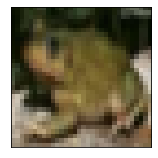

label: frog confidence: 0.99988115

After


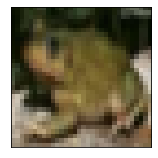

label: frog confidence: 0.99988115

Before


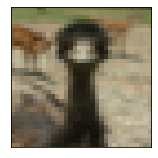

label: bird confidence: 0.996635

After


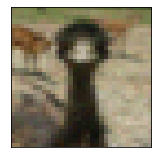

label: deer confidence: 0.94830894

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0    

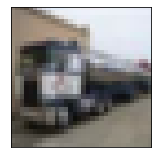

label: truck confidence: 0.9999819

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

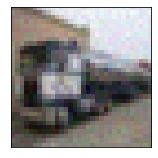

label: frog confidence: 0.99825305

With  label_smoothing defense applied

BEFORE DEFENSE


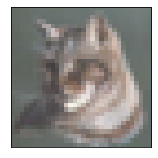

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

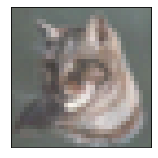

label: dog confidence: 0.84970987

With  class_labels defense applied

BEFORE DEFENSE


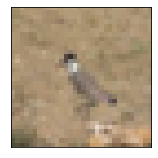

label: bird confidence: 0.99998426

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

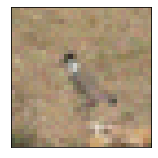

label: cat confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


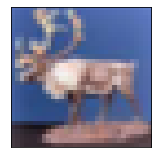

label: deer confidence: 0.9916221

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

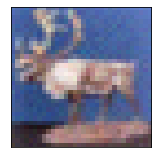

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


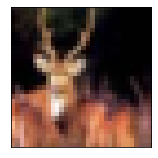

label: deer confidence: 0.99875915

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

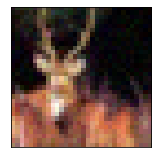

label: frog confidence: 0.99115366

With  spatial_smoothing defense applied

BEFORE DEFENSE


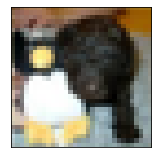

label: dog confidence: 0.8305685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

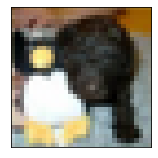

label: cat confidence: 0.65545636

With  thermometer_encoding defense applied

BEFORE DEFENSE


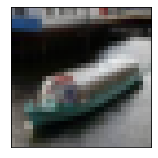

label: ship confidence: 0.99470395

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

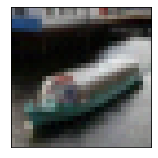

label: truck confidence: 0.93618697

With  variance_minimization defense applied

BEFORE DEFENSE


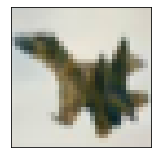

label: airplane confidence: 0.9943743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      

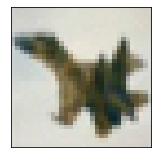

label: frog confidence: 0.91866064

With  reverse_sigmoid defense applied

BEFORE DEFENSE


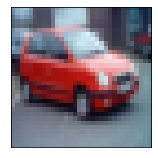

label: automobile confidence: 0.99999547

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00   

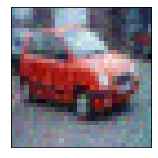

label: truck confidence: 0.2898255

With  rounded defense applied

BEFORE DEFENSE


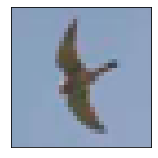

label: bird confidence: 0.9990896

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

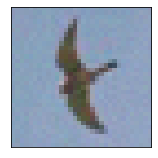

label: deer confidence: 0.99

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


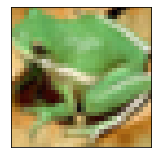

label: frog confidence: 0.99978346

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

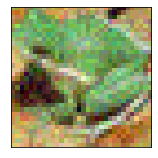

label: bird confidence: 0.9995989

With  evasion defense applied

BEFORE DEFENSE


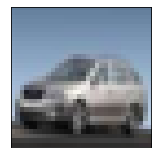

label: automobile confidence: 0.99995446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00   

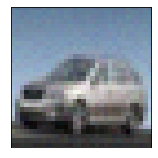

label: truck confidence: 0.99555486

With  0, std=1 defense applied

BEFORE DEFENSE


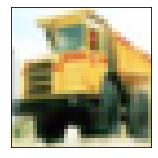

label: truck confidence: 0.99998355

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00      0.

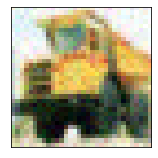

label: frog confidence: 0.9849641

With  0, std=1 defense applied

BEFORE DEFENSE


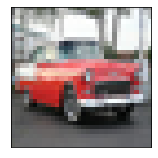

label: automobile confidence: 0.99957126

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.06 
               precision    recall  f1-score   support

           0       0.00      0.00   

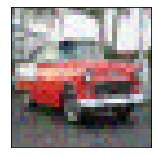

label: deer confidence: 0.9578582

                                                 TARGETED ATTACK                                                



HopSkipJump:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


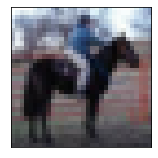

label: horse confidence: 0.9999865

After


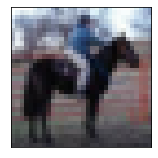

label: horse confidence: 0.9999865

Before


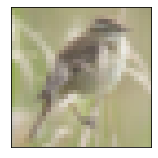

label: bird confidence: 0.9998896

After


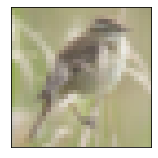

label: bird confidence: 0.9998896

Before


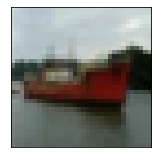

label: ship confidence: 0.9999877

After


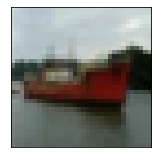

label: ship confidence: 0.9999877

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0     

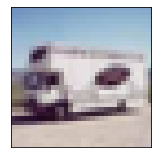

label: truck confidence: 0.9992285

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

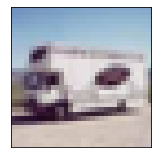

label: truck confidence: 0.9992285

With  label_smoothing defense applied

BEFORE DEFENSE


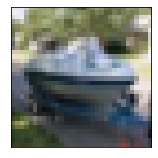

label: ship confidence: 0.999342

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95 

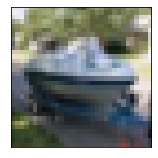

label: ship confidence: 0.999342

With  class_labels defense applied

BEFORE DEFENSE


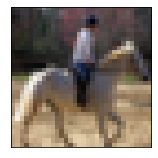

label: horse confidence: 0.9999925

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

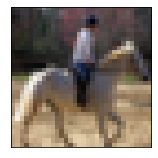

label: horse confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


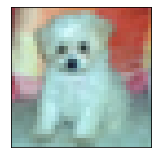

label: dog confidence: 0.9996018

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

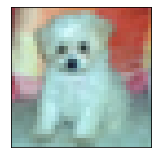

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


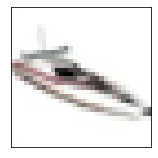

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

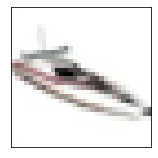

label: ship confidence: 0.99770063

With  spatial_smoothing defense applied

BEFORE DEFENSE


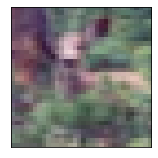

label: deer confidence: 0.9994727

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

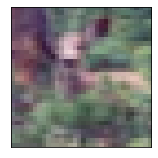

label: deer confidence: 0.9994727

With  thermometer_encoding defense applied

BEFORE DEFENSE


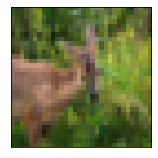

label: deer confidence: 0.99969685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

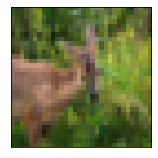

label: deer confidence: 0.99969685

With  variance_minimization defense applied

BEFORE DEFENSE


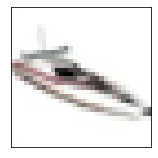

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

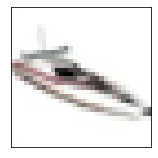

label: ship confidence: 0.99770063

With  reverse_sigmoid defense applied

BEFORE DEFENSE


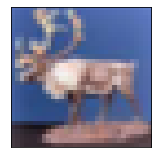

label: deer confidence: 0.9916221

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

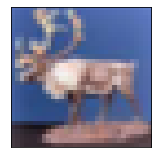

label: deer confidence: 0.35571262

With  rounded defense applied

BEFORE DEFENSE


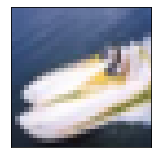

label: ship confidence: 0.9999528

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

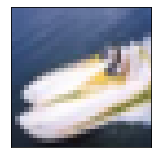

label: ship confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


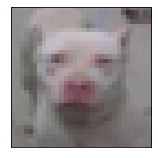

label: dog confidence: 0.99814594

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

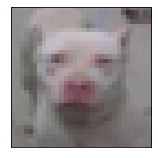

label: dog confidence: 0.99814594

With  evasion defense applied

BEFORE DEFENSE


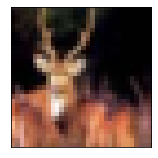

label: deer confidence: 0.99875915

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

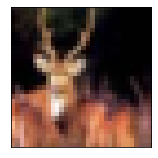

label: deer confidence: 0.99875915

With  0, std=1 defense applied

BEFORE DEFENSE


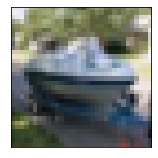

label: ship confidence: 0.999342

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95 

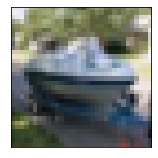

label: ship confidence: 0.999342

With  0, std=1 defense applied

BEFORE DEFENSE


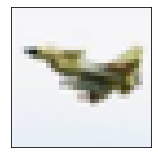

label: airplane confidence: 0.9999666

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      

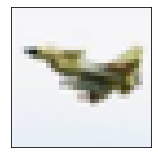

label: airplane confidence: 0.9999666


In [40]:
from art.attacks.evasion import HopSkipJump

hop_skip_jump = HopSkipJump(classifier=classifier,max_iter=5,max_eval=1000)
hop_skip_jump_targeted = HopSkipJump(classifier=classifier,max_iter=5,max_eval=1000,targeted=True)


perform_attack(hop_skip_jump, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(hop_skip_jump_targeted, defenses)

threshold attack

In [41]:
!pip install cma

     |████████████████████████████████| 269 kB 2.3 MB/s 


In [42]:
from art.attacks.evasion import ThresholdAttack

threshold_attack = ThresholdAttack(classifier=classifier,th=.01)
threshold_attack_targeted = ThresholdAttack(classifier=classifier,th=.01,targeted=True)


perform_attack(threshold_attack, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(threshold_attack_targeted, defenses)

KeyboardInterrupt: ignored

Pixel Attack

In [ ]:
from art.attacks.evasion import PixelAttack

pixel_attack = PixelAttack(classifier=classifier,th=1)
pixel_attack_targeted = PixelAttack(classifier=classifier,th=1,targeted=True)

perform_attack(pixel_attack, defenses)
print('\n==============================================================================================================')
print('                                                 TARGETED ATTACK                                                ')
print('==============================================================================================================\n')

perform_attack(pixel_attack_targeted, defenses)

KeyboardInterrupt: ignored

Spatial Transformation attack

Spatial transformation:   0%|          | 0/1 [00:00<?, ?it/s]


Attack effects on image

Before


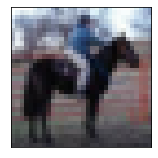

label: horse confidence: 0.9999865

After


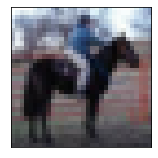

label: horse confidence: 0.9999865

Before


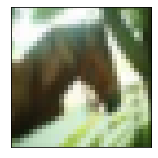

label: horse confidence: 0.9865827

After


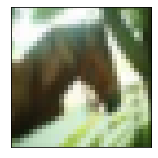

label: horse confidence: 0.9865827

Before


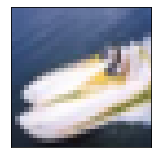

label: ship confidence: 0.9999528

After


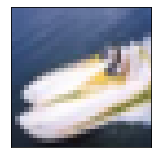

label: ship confidence: 0.9999528

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0     

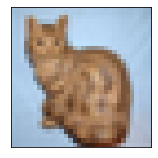

label: cat confidence: 0.99942636

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

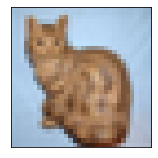

label: cat confidence: 0.99942636

With  label_smoothing defense applied

BEFORE DEFENSE


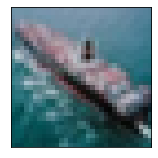

label: ship confidence: 0.99998987

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

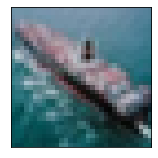

label: ship confidence: 0.99998987

With  class_labels defense applied

BEFORE DEFENSE


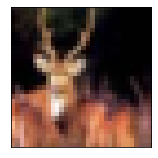

label: deer confidence: 0.99875915

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

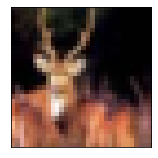

label: deer confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


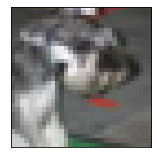

label: cat confidence: 0.9982356

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

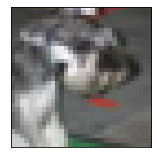

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


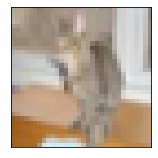

label: cat confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

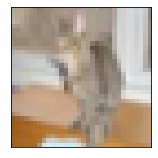

label: cat confidence: 0.99998045

With  spatial_smoothing defense applied

BEFORE DEFENSE


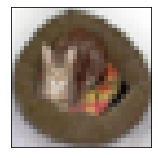

label: cat confidence: 0.9995546

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95 

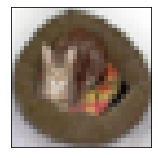

label: cat confidence: 0.9995546

With  thermometer_encoding defense applied

BEFORE DEFENSE


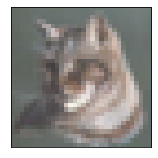

label: cat confidence: 0.9807608

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95 

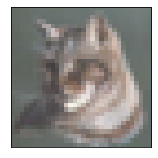

label: cat confidence: 0.9807608

With  variance_minimization defense applied

BEFORE DEFENSE


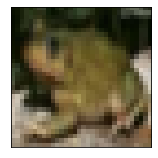

label: frog confidence: 0.99988115

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

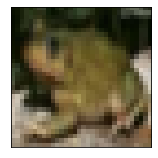

label: frog confidence: 0.99988115

With  reverse_sigmoid defense applied

BEFORE DEFENSE


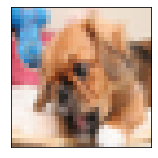

label: dog confidence: 0.99961483

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

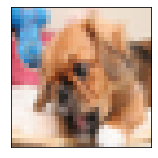

label: dog confidence: 0.25251174

With  rounded defense applied

BEFORE DEFENSE


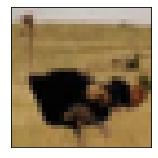

label: bird confidence: 0.9998702

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

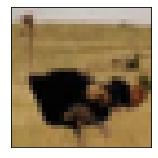

label: bird confidence: 1.0

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


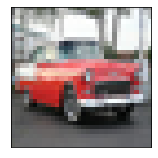

label: automobile confidence: 0.99957126

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90   

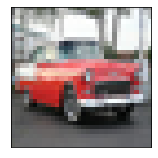

label: automobile confidence: 0.99957126

With  evasion defense applied

BEFORE DEFENSE


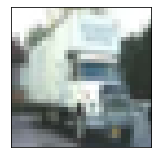

label: truck confidence: 0.9999851

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.9

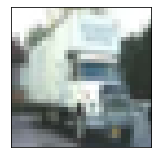

label: truck confidence: 0.9999851

With  0, std=1 defense applied

BEFORE DEFENSE


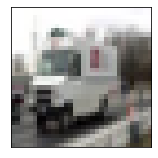

label: truck confidence: 0.99987054

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.

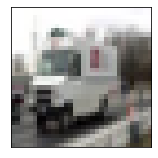

label: truck confidence: 0.99987054

With  0, std=1 defense applied

BEFORE DEFENSE


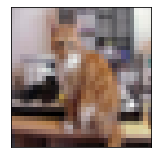

label: cat confidence: 0.99966383

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95

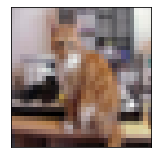

label: cat confidence: 0.99966383


In [43]:
from art.attacks.evasion import SpatialTransformation

spatial_transformation = SpatialTransformation(classifier=classifier)

perform_attack(spatial_transformation, defenses)

Square attack

SquareAttack - restarts:   0%|          | 0/1 [00:00<?, ?it/s]

SquareAttack - iterations:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


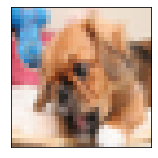

label: dog confidence: 0.99961483

After


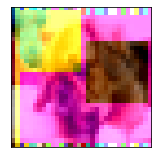

label: cat confidence: 0.7400291

Before


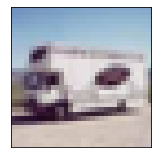

label: truck confidence: 0.9992285

After


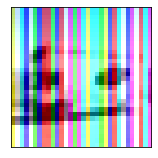

label: dog confidence: 0.58342934

Before


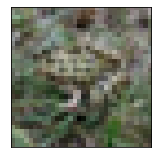

label: frog confidence: 0.99995065

After


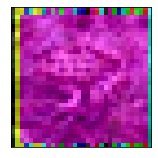

label: cat confidence: 0.48983377

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0      

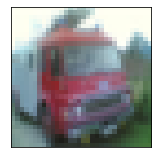

label: truck confidence: 0.9999789

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

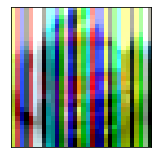

label: frog confidence: 0.87035674

With  label_smoothing defense applied

BEFORE DEFENSE


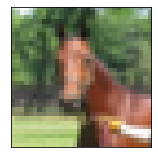

label: horse confidence: 0.99998045

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.0

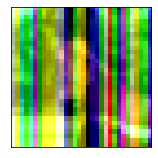

label: frog confidence: 0.87164575

With  class_labels defense applied

BEFORE DEFENSE


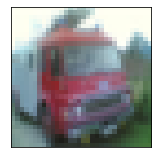

label: truck confidence: 0.9999789

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

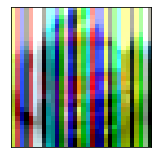

label: frog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


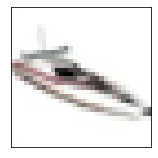

label: ship confidence: 0.99770063

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

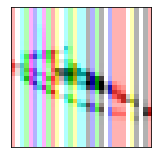

label: airplane confidence: 0.0

With  feature_squeezing defense applied

BEFORE DEFENSE


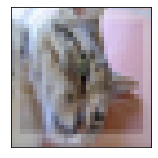

label: cat confidence: 0.863001

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00   

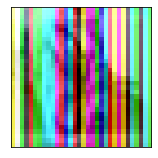

label: automobile confidence: 0.5889699

With  spatial_smoothing defense applied

BEFORE DEFENSE


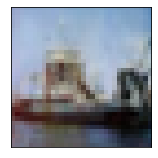

label: ship confidence: 0.9998846

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

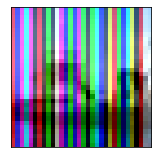

label: frog confidence: 0.8583285

With  thermometer_encoding defense applied

BEFORE DEFENSE


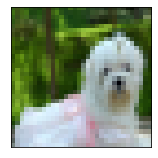

label: dog confidence: 0.99533075

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00 

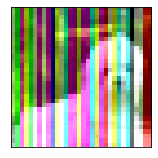

label: frog confidence: 0.89110786

With  variance_minimization defense applied

BEFORE DEFENSE


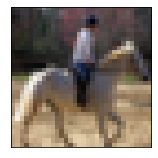

label: horse confidence: 0.9999925

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

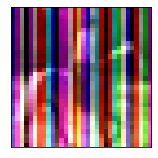

label: dog confidence: 0.6621971

With  reverse_sigmoid defense applied

BEFORE DEFENSE


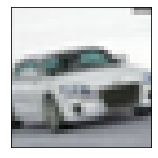

label: automobile confidence: 0.99968743

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00    

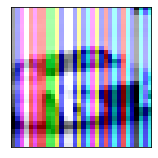

label: frog confidence: 0.35985935

With  rounded defense applied

BEFORE DEFENSE


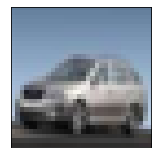

label: automobile confidence: 0.99995446

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00    

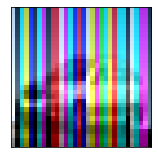

label: dog confidence: 0.42

With  adversarial_trainer_madry_pgd defense applied

BEFORE DEFENSE


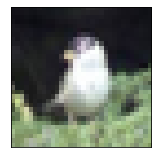

label: bird confidence: 0.99892396

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

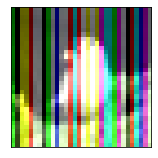

label: cat confidence: 0.7901705

With  evasion defense applied

BEFORE DEFENSE


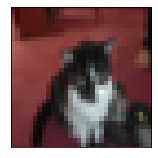

label: cat confidence: 0.9995685

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

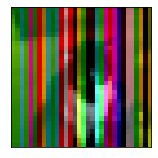

label: frog confidence: 0.96975917

With  0, std=1 defense applied

BEFORE DEFENSE


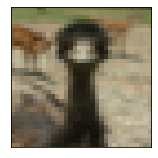

label: bird confidence: 0.996635

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

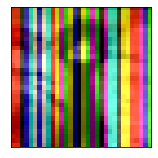

label: frog confidence: 0.99418914

With  0, std=1 defense applied

BEFORE DEFENSE


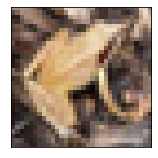

label: frog confidence: 0.955936

Performance on originals examples:
 Accuracy: 0.95 
               precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10
           3       0.80      0.80      0.80        10
           4       0.91      1.00      0.95        10
           5       1.00      0.80      0.89        10
           6       0.91      1.00      0.95        10
           7       1.00      1.00      1.00        10
           8       0.91      1.00      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00  

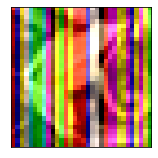

label: dog confidence: 0.84315574


In [44]:
from art.attacks.evasion import SquareAttack
square_attack = SquareAttack(estimator=classifier)
perform_attack(square_attack, defenses)

SimBA attack

In [46]:
from art.attacks.evasion import SimBA
simba_attack = SimBA(classifier=classifier)
perform_attack(simba_attack, defenses)

KeyboardInterrupt: ignored

Boundary Attack/Decison-based attack

Boundary attack:   0%|          | 0/100 [00:00<?, ?it/s]


Attack effects on image

Before


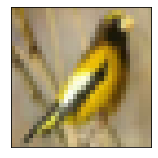

label: bird confidence: 0.9995808

After


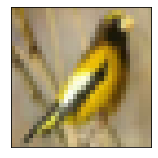

label: bird confidence: 0.9995808

Before


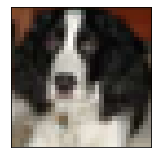

label: dog confidence: 0.9985262

After


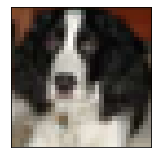

label: dog confidence: 0.9985262

Before


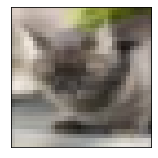

label: cat confidence: 0.9971046

After


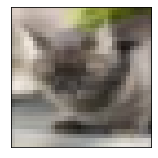

label: cat confidence: 0.9971046

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

performance on adversarial examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0      

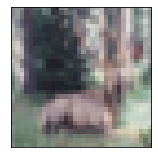

label: deer confidence: 0.9803345

Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95

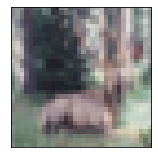

label: deer confidence: 0.9803345

With  label_smoothing defense applied

BEFORE DEFENSE


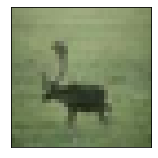

label: deer confidence: 0.98934424

Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.9

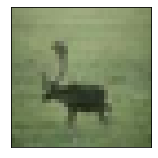

label: deer confidence: 0.98934424

With  class_labels defense applied

BEFORE DEFENSE


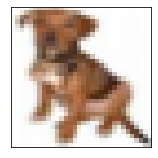

label: dog confidence: 0.99998534

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

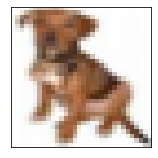

label: dog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


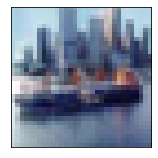

label: ship confidence: 0.99886775

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18 

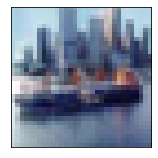

label: airplane confidence: 0.0


In [ ]:
from art.attacks.evasion import BoundaryAttack
bound_attack = BoundaryAttack(estimator=classifier)
perform_attack(bound_attack, defenses)

Geometric Decision-based attack

GeoDA - samples:   0%|          | 0/100 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]

GeoDA - steps:   0%|          | 0/9 [00:00<?, ?it/s]


Attack effects on image

Before


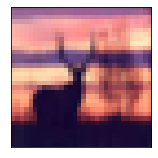

label: deer confidence: 0.9941732

After


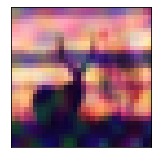

label: airplane confidence: 0.4817535

Before


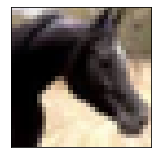

label: horse confidence: 0.99998736

After


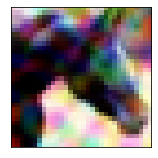

label: frog confidence: 0.46728075

Before


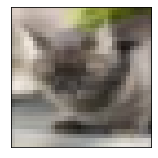

label: cat confidence: 0.9971046

After


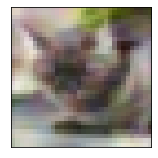

label: bird confidence: 0.6186745

Performance w/ No Defense
performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0      

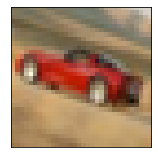

label: automobile confidence: 0.9999863

Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00     

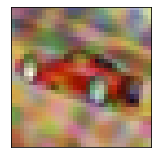

label: bird confidence: 0.364265

With  label_smoothing defense applied

BEFORE DEFENSE


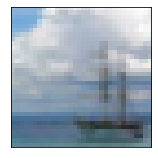

label: ship confidence: 0.99998903

Performance on originals examples:
 Accuracy: 0.97 
               precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00        10
           2       0.91      1.00      0.95        10
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10
           5       0.90      0.90      0.90        10
           6       1.00      1.00      1.00        10
           7       1.00      0.90      0.95        10
           8       1.00      0.90      0.95        10
           9       1.00      1.00      1.00        10

    accuracy                           0.97       100
   macro avg       0.97      0.97      0.97       100
weighted avg       0.97      0.97      0.97       100

Performance on adversarial examples:
 Accuracy: 0.0 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00

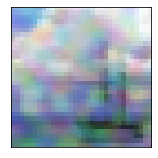

label: airplane confidence: 0.5710374

With  class_labels defense applied

BEFORE DEFENSE


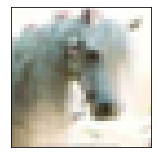

label: dog confidence: 0.6516687

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18   

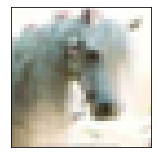

label: dog confidence: 1.0

With  high_confidence defense applied

BEFORE DEFENSE


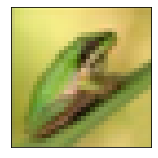

label: frog confidence: 0.9998715

Performance on originals examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18        10
           1       0.00      0.00      0.00        10
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00        10
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        10
           9       0.00      0.00      0.00        10

    accuracy                           0.10       100
   macro avg       0.01      0.10      0.02       100
weighted avg       0.01      0.10      0.02       100

Performance on adversarial examples:
 Accuracy: 0.1 
               precision    recall  f1-score   support

           0       0.10      1.00      0.18  

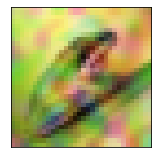

label: airplane confidence: 0.0


In [ ]:
from art.attacks.evasion import GeoDA
geo_attack = GeoDA(estimator=classifier)
perform_attack(geo_attack, defenses)

In [ ]:
from art.estimators.classification import QueryEfficientGradientEstimationClassifier
que_attack = QueryEfficientGradientEstimationClassifier(classifier=classifier,num_basis = int, sigma = float, round_samples = 0.0)
perform_attack(que_attack, defenses)

AttributeError: ignored